# <b> Introduction Boston Crime

**EDA** ini meninjau `laporan insiden kejahatan` di kota *Boston* (2015 hingga 2018).<br>
*The data is originally provided by Boston's open data hub, [Analyze Boston](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system).*

## Background

***Boston*** merupakan salah satu kota terpadat di ***Amerika Serikat***. *Boston* juga terkenal memiliki kesenjangan sosial dan ekonomi yang signifikan antara penduduknya.
Terdapat wilayah-wilayah yang sangat makmur dan modern, sementara wilayah lainnya menghadapi kemiskinan dan kekurangan akses ke layanan publik.
[Kesenjangan Sosial di Boston](https://www.bbc.com/indonesia/vert-cap-43237755) ini yang menyebabkan `tingginya tingkat kejahatan`.


## Objective

*Tujuan* dari analisis kejahatan di *Boston* ini adalah untuk `memberikan informasi yang akurat dan terkini` tentang profesi kejahatan di wilayah tertentu. Metode yang digunakan adalah ***Metode Analisis Kejahatan.*** Metode ini adalah metode yang digunakan para ahli keamanan untuk bisa mengindentifikasi pola-pola kriminalitas dan `memprediksi kemungkinan terjadinya kejahatan dimasa depan.`

## Problem Statement

Dataset *`Crime in Boston`* menunjukkan bahwa kota ini memiliki `tingkat kejahatan yang relatif tinggi`. oleh karena itu informasi ini akan membantu pihak berwenang/pemerintah dan masyarakat untuk meningkatkan keamanan dan mengurangi tingkat kejahatan.<br>
Sebagai seorang ***data analyst***, kita akan mencoba menjawab pertanyaan berikut:

<B> Bagaimana strategi terbaik untuk meningkatkan keamanan dan mengurangi tingkat kejahatan di *Boston*?

## Data Understanding

Untuk menjawab *`Probelm Statement`* diatas, maka kita akan menganalisa dua Dataset *`Crime in Boston`* . Dua Dataset (*`crime`* dan *`offence_codes`*) ini berisikan informasi tentang insiden kejahatan di kota *Boston*. Berikut adalah nama kolom dan informasi datanya:

| Columns | Description
| ----- | ---------- |
|INCIDENT_NUMBER | ID insiden setelah dilaporkan
|OFFENSE_CODE | Kode jenis kejahatan
|OFFENSE_CODE_GROUP | Tipe kejahatan
|OFFENSE_DESCRIPTION | Deskripsi kejahatan
|DISTRICT | Wilayah kejahatan terjadi
|REPORTING AREA | kode Area kejahatan dilaporkan
|SHOOTING | Penembakan atau tidak (kosong/Y sampai 2018, 0/1 dari 2019)
|OCCURRED_ON_DATE| Tanggal dan waktu laporan
|YEAR| Tahun laporan
|MONTH | Bulan laporan
|DAY_OF_WEEK | Hari kejahatan terjadi
|HOUR | Jam laporan
|UCR_PART | Bagian Sistem Uniform Crime Reporting (UCR)
|STREET |Jalan terjadinya laporan kejahatan
|Lat | Latitute tempat terjadinya laporan kejahatan
|Long | Longitude tempat terjadinya laporan kejahatan
|Location | Coordinates tempat terjadinya laporan kejahatan

| Columns | Description
| ----- | ---------- |
|CODE | Kode jenis kejahatan
|NAME | Deskripsi kejahatan saat kejadian

*Data set Crime terdiri dari 17 Feature atau Columns sedangkan Dataset Offence_codes hanya terdiri dari 2 Feature atau Columns*.

# <B> Data Preparation

## Import Library

In [1]:
# import relevant libraries
import pandas as pd
import numpy as np
from pandas import Series, DataFrame
import matplotlib.pyplot as plt
import os
import time
import seaborn as sns
%matplotlib inline
import folium
from folium.plugins import HeatMap
!pip install plotly==5.5.0
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from datetime import datetime
import scipy.stats as stats
p = "YlGnBu"
p2 = "YlGn"
p3 = "Greys"
p4="viridis"
p5="coolwarm"
import warnings
warnings.filterwarnings('ignore')

Defaulting to user installation because normal site-packages is not writeable


## Load the Data

In [2]:
#The encoding for the file is different and so we need to specify that while reading it in
df = pd.read_csv('crime.csv', encoding = "ISO-8859-1")
of = pd.read_csv('offense_codes.csv', encoding = "ISO-8859-1") 

<b> The reason for using encoding <br> 
    
Khusus untuk dataset ini, digunakan *encoding ISO-8859-1* untuk memastikan karakter-karakter dalam *file csv* terbaca dengan benar oleh *Pandas.* karena  beberapa karakter dalam dataset tidak termasuk dalam standar `ASCII (American Standard Code for Information Interchange)`. Tanpa *encoding* yang sesuai, karakter *non-ASCII* dapat terbaca sebagai karakter aneh atau bahkan tidak terbaca sama sekali.

In [3]:
#Previewing dataset Crime
df.head(2)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"


In [4]:
#Previewing dataset Offense Codes
of.head(2)

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING


## Information The Data

In [5]:
# get the information about the dataframe
df.info(), of.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

(None, None)

In [6]:
#Check Number of Rows & Features in the Crime and Offence_codes dataset
print('Total Crime Dataset :', df.shape)
print('Total Offence_codes Dataset :', of.shape)

Total Crime Dataset : (319073, 17)
Total Offence_codes Dataset : (576, 2)


In [7]:
# #Checking the number of unique values in a column of a dataset
# pd.set_option('display.max_colwidth', None) # max_rows, 
# pd.get_option('display.max_columns', None)
# # pd.options.display.max_columns
# # data unik di tiap kolom
# listItem = []
# for col in df.columns :
#     listItem.append( [col, df[col].nunique(), df[col].unique()])

# tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
#                      data=listItem)
# tabel1Desc

In [8]:
# #Checking the number of unique values in a column of a dataset
# pd.set_option('display.max_colwidth', None) # max_rows, 
# pd.get_option('display.max_columns', None)
# # pd.options.display.max_columns
# # data unik di tiap kolom
# listItem = []
# for col in of.columns :
#     listItem.append( [col, of[col].nunique(), of[col].unique()])

# tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
#                      data=listItem)
# tabel1Desc

<b> Observation<br>
* Terlihat bahwa dataset *`Crime`* dan *`offense_codes`* berbeda, maka perlu diamati lebih lanjut<br> 
* Diperlukan pengubahan nama kolom dan pengubahan isi value agar mudah dipahami <br> 
* Diperlukan juga pengubahan tipe data agar data bisa di analisis lebih lanjut <br>  
* Ditemukan kolom `Location` memiliki nilai yang sama dengan kolom lain, maka perlu diamati lebih lanjut<br>
* terdapat missing value di beberapa kolom (`DISTRICT`,`SHOOTING`,`UCR_PART`,`STREET`, `Lat`,dan `Long`)

# <b> Data Exploration (exploratory data analysis or EDA)

## Exploring The Data

### Creating a Offense codes Analysis dataset

In [9]:
# Let's explore the offense_codes dataset
of['CODE'].nunique() , df['OFFENSE_CODE'].nunique() # Different

(425, 222)

In [10]:
#display the difference in unique values between the two columns
diff = abs(df['OFFENSE_CODE'].nunique() - of['CODE'].nunique())
print('Jumlah Code yang berbeda',diff)

# Finding unique values in the 'CODE' column
of_only = of[~of['CODE'].isin(df['OFFENSE_CODE'])]
of_only['CODE'].unique()[:10]  # Sample CODE yg hanya ada di OFFENSE_CODE

Jumlah Code yang berbeda 203


array([1731, 1711,  242,  254,  271,  244,  251,  241,  243,  261],
      dtype=int64)

In [11]:
# Let's explore the offense_codes dataset
of['NAME'].nunique() , df['OFFENSE_DESCRIPTION'].nunique() # Different

(479, 244)

In [12]:
#display the difference in unique values between the two columns
diff_name = abs(of['NAME'].nunique() - df['OFFENSE_DESCRIPTION'].nunique())
print('Jumlah Deskripsi yang berbeda',diff_name)

# Get the unique codes in of that are not in df
unique_codes_of = of[~of['CODE'].isin(df['OFFENSE_CODE'])]['CODE'].unique()

# Create a new dataframe with the unique codes and their descriptions
missing_codes_df = pd.DataFrame({'CODE': unique_codes_of})
missing_codes_df = missing_codes_df.merge(of[['CODE', 'NAME']], on='CODE')

# Display the missing codes dataframe
missing_codes_df[:2]

Jumlah Deskripsi yang berbeda 235


,CODE,NAME
0,1731,INCEST
1,1711,OPEN & GROSS LEWDNESS


In [13]:
# Displaying results that are not available in the crime column and only exist in the offence code column.
checkdf = df[(df['OFFENSE_CODE'] == 1731) & (df['OFFENSE_DESCRIPTION'] == 'INCEST')]
checkof = of[(of['CODE'] ==1731 ) & (of['NAME'] == 'INCEST')]
#checkdf
checkof

,CODE,NAME
3,1731,INCEST


**Observation**

Terdapat perbedaan total `Code`  antara dataset `Crime` dan `offense_codes` Hal ini mungkin disebabkan karena beberapa alasan, seperti adanya penambahan kejahatan dengan lebih spesifik.Kedua dataset tersebut dapat digunakan untuk memahami tren dan pola kejahatan di *Boston*, sehingga memberikan `informasi yang berharga tentang kejahatan di kota tersebut`.



### Creating a Crime Analysis dataset

In [14]:
# Let's explore the crime dataset
# Rename columns to something easier to type (the all-caps are annoying!)
rename = {'OFFENSE_DESCRIPTION' : 'DESCRIPTION',
         'REPORTING_AREA':'AREA',
         'DAY_OF_WEEK':'DAY'}
df.rename(index=str, columns=rename, inplace=True)

# convert the data type from object to datetime
df['OCCURRED_ON_DATE'] = df['OCCURRED_ON_DATE'].apply(lambda x: datetime.strptime(x,"%Y-%m-%d %H:%M:%S"))

# Change District and Month Type values into more understandable values
df['DISTRICT'] = df.DISTRICT.replace(['D14', 'C11', 'D4', 'B3', 'B2', 'C6', 'A1', 'E5', 'A7', 'E13','E18', 'A15'],
["Brighton", "Dorchester" ,"South End" ,"Mattapan","Roxbury","South Boston","Downtown","West Roxbury" ,"East Boston","Jamaica Plain","Hyde Park","Charlestown"])

df['MONTH'] = df.MONTH.replace([1,2,3,4,5,6,7,8,9,10,11,12],
['Jan','Feb','Mar','April','Mei','Juni','Juli','Agust','Sep','Okt','Nov', 'Des'])

<b> Explanation of reason<br>

1. Dilakukan perubahan nama dibeberapa kolom (`OFFENSE_DESCRIPTION`,`REPORTING_AREA`,`DAY_OF_WEEK`,) karena nama terlalu panjang (dibuat sederhana) agar kolom bisa lebih mudah dipahami dan dimengerti.
2. Dilakukan perubahan tipe data pada kolom(`OCCURRED_ON_DATE`) yang sebelumnya tipe data `object` menjadi `datetime` 
3. Dilakukan perubahan nama pada isi value kolom  (`District` and `Month`) agar bisa lebih mudah dipahami dan dimengerti. perubahan isi value kolom `District` disesuaikan yang dapat diakses di [sini](https://bpdnews.com/districts/).

# <b>  Investigating The Data 

## Handling Duplicate Data

In [15]:
# Check Duplicated Data 
print(f'Number of duplicated data (before drop duplicate) = {df.duplicated().sum()}')
duplicated = df.duplicated(keep=False) # keep = False untuk check apakah data benar2 duplicate
df[duplicated].head(2)

Number of duplicated data (before drop duplicate) = 23


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DESCRIPTION,DISTRICT,AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY,HOUR,UCR_PART,STREET,Lat,Long,Location
318742,I152030570-00,3125,Warrant Arrests,WARRANT ARREST,Jamaica Plain,303,NaN,2016-10-29 08:25:00,2016,Okt,Saturday,8,Part Three,W WALNUT PARK,42.317207,-71.098799,"(42.31720702, -71.09879922)"
318745,I152030570-00,3125,Warrant Arrests,WARRANT ARREST,Jamaica Plain,303,NaN,2016-10-29 08:25:00,2016,Okt,Saturday,8,Part Three,W WALNUT PARK,42.317207,-71.098799,"(42.31720702, -71.09879922)"


In [16]:
# Drop Duplicated Data 
df.drop_duplicates(keep = 'first', inplace = True) # Drop Data awal yg duplicate 
print(f'Number of rows (after drop duplicate) = {df.shape[0]}')

Number of rows (after drop duplicate) = 319050


<b> Explanation of reason<br>

Setelah melakukan pengecekan dengan menggunakan *`duplicated(keep=False)`*, didapatkan hasil bahwa dataset *Crime* memiliki 23 baris yang merupakan *duplikat* atau data yang sama. Oleh karena itu, dilakukan *`drop duplicates`* untuk menghapus baris-baris tersebut.

## Descriptive statistics

In [17]:
#Statistic Summary Numerical 
display(df.describe().T) 

,count,mean,std,min,25%,50%,75%,max
OFFENSE_CODE,319050.0,2317.516957,1185.308921,111.000000,1001.000000,2907.000000,3201.000000,3831.000000
YEAR,319050.0,2016.560674,0.996312,2015.000000,2016.000000,2017.000000,2017.000000,2018.000000
HOUR,319050.0,13.118176,6.294258,0.000000,9.000000,14.000000,18.000000,23.000000
Lat,299052.0,42.214373,2.159845,-1.000000,42.297438,42.325538,42.348624,42.395042
Long,299052.0,-70.908260,3.493746,-71.178674,-71.097135,-71.077524,-71.062467,-1.000000


In [18]:
# Statistic Summary Categorical
df.describe(include='object').T

,count,unique,top,freq
INCIDENT_NUMBER,319050,282517,I162030584,13
OFFENSE_CODE_GROUP,319050,67,Motor Vehicle Accident Response,37132
DESCRIPTION,319050,244,SICK/INJURED/MEDICAL - PERSON,18783
DISTRICT,317285,12,Roxbury,49940
AREA,319050,879,,20250
SHOOTING,1019,1,Y,1019
MONTH,319050,12,Agust,34821
DAY,319050,7,Friday,48489
UCR_PART,318960,4,Part Three,158537
STREET,308179,4657,WASHINGTON ST,14192


**Observation**

* Di temukan kolom *numerical* (`Year`) tampaknya mengalami kemiringan kekiri *(left skew)* <br>
* Di temukan kolom *numerical* (`Long & Lat`) yang mengandung nilai -1.000000 <br> 
* Di temukan bahwa kolom *categorical* pada kolom `INCIDENT_NUMBER` memiliki perbedaan antara total data dengan data unik <br> 
* Ditemukan kolom *categorical*  pada kolom `AREA` ditribusi Area terbanyak tidak diketahui <br>
* Dan ditemukan juga kolom *categorical*  pada kolom `Location` yang mengandung nilai (0.00000000, 0.00000000)<br> 

*Semua Penemuan ini perlu diperhatikan dan diamati lebih lanjut.*

### `Long,Lat and Location` analysis

Pengamatan lanjutan:

Setelah melihat ringkasan ***statistik deskriptif*** pada kolom `Long  Lat`, ditemukan bahwa terdapat nilai ***-1.000000*** pada kedua kolom tersebut. Selain itu, juga ditemukan bahwa pada kolom `location` terdapat nilai ***(0.00000000, 0.00000000)*** yang kemungkinan tidak valid untuk menunjukkan lokasi kejadian. Oleh karena itu, perlu dilakukan analisis lebih lanjut untuk memastikan bagaimana nilai-nilai tersebut dapat ditangani dengan tepat.

<b> Checking Long Lat Columns

In [19]:
# checking the value -1 in the longitude and latitude columns
df[df['Long'] == -1].head(2)
df[df['Lat'] == -1].head(2)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DESCRIPTION,DISTRICT,AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY,HOUR,UCR_PART,STREET,Lat,Long,Location
20,I182070913,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,NaN,,NaN,2018-09-03 18:46:00,2018,Sep,Monday,18,Part Three,WOLCOTT,-1.0,-1.0,"(-1.00000000, -1.00000000)"
126,I182070799,3410,Towed,TOWED MOTOR VEHICLE,NaN,,NaN,2018-09-03 11:55:00,2018,Sep,Monday,11,Part Three,CHELSEA,-1.0,-1.0,"(-1.00000000, -1.00000000)"


In [20]:
# # Count the number of Long and Lat -1
count_long = len(df[df['Long'] == -1])
count_lat = len(df[df['Lat'] == -1])
print('The number of Rows Long and Lat -1 is', count_long)
total_rows = len(df)
percen_long = (count_long / total_rows) * 100
percen_lat = (count_lat / total_rows) * 100
print('The percentage of Long and Lat -1 is {:.2f}%'.format(percen_long))

# #Changing the data type of areas with spaces to NaN
df['Long'].replace([-1.0], np.nan, inplace=True)
df['Lat'].replace([-1.0], np.nan, inplace=True)

The number of Rows Long and Lat -1 is 745
The percentage of Long and Lat -1 is 0.23%


<b> Checking Location Columns

In [21]:
# checking the value -1 in the Location column
df[df['Location'] == '(-1.00000000, -1.00000000)'].head(2) # ditemukan juga kolom location bernilai -1 sama dengan kolom long lat 

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DESCRIPTION,DISTRICT,AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY,HOUR,UCR_PART,STREET,Lat,Long,Location
20,I182070913,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,NaN,,NaN,2018-09-03 18:46:00,2018,Sep,Monday,18,Part Three,WOLCOTT,NaN,NaN,"(-1.00000000, -1.00000000)"
126,I182070799,3410,Towed,TOWED MOTOR VEHICLE,NaN,,NaN,2018-09-03 11:55:00,2018,Sep,Monday,11,Part Three,CHELSEA,NaN,NaN,"(-1.00000000, -1.00000000)"


In [22]:
# checking the value 0 in the Location column
df[df['Location'] == '(0.00000000, 0.00000000)'].head(2)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DESCRIPTION,DISTRICT,AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY,HOUR,UCR_PART,STREET,Lat,Long,Location
42,I182070888,301,Robbery,ROBBERY - STREET,Downtown,76,NaN,2018-09-03 15:45:00,2018,Sep,Monday,15,Part One,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
386,I182070501,361,Robbery,ROBBERY - OTHER,Roxbury,177,NaN,2018-09-01 19:00:00,2018,Sep,Saturday,19,Part One,NaN,NaN,NaN,"(0.00000000, 0.00000000)"


<b> After checking the location column, it was found that this column has a value of -1

In [23]:
# Count the number of Location -1
location_1 = len(df[df['Location'] == '(-1.00000000, -1.00000000)'])
location_0 = len(df[df['Location'] == '(0.00000000, 0.00000000)'])
print('The number of Rows Location and Lat -1 is', location_1)
print('The number of Rows Location and Lat 0 is', location_0)

The number of Rows Location and Lat -1 is 745
The number of Rows Location and Lat 0 is 19998


In [24]:
# Count Percentage Location 
total_rows = len(df)
percen_location1 = (location_1 / total_rows) * 100
percen_location0 = (location_0  / total_rows) * 100
print('The percentage of Location -1 is {:.2f}%'.format(percen_location1))
print('The percentage of Location 0 is {:.2f}%'.format(percen_location0))

The percentage of Location -1 is 0.23%
The percentage of Location 0 is 6.27%


Setelah dilakukan Investigasi:<br> 

* Ditemukan 745 baris (atau sekitar 0.23% dari seluruh data) dengan nilai -1 pada kolom `Long & Lat`. <br>
* Ditemukan juga 745 baris (atau sekitar 0.23% dari seluruh data) dengan nilai -1 pada kolom `Location`. <br>
* Ditemukan 19998 baris (atau sekitar 6.27% dari seluruh data) dengan nilai 0 pada kolom `Location`. <br> 

*Untuk mengatasi masalah ini kita perlu merubah nilai pada kolom `Long & Lat` yang memiliki nilai -1 menjadi `Nan`.*

## Drop Irrelevant Columns

*Setelah melakukan investigasi ditemukan juga kolom ***Location*** yang terbukti redundan karena memiliki informasi yang sama dengan kolom `Long Lat`,
Oleh karena itu, keputusan yang diambil menghapus kolom tersebut ***(redundant).****

In [25]:
# Removed Columns: ['Long', 'Lat'] (redundant with 'location' column)
df.drop(['Location'],axis =1 , inplace = True)

### `Incident Number` analysis

Pengamatan lanjutan:

Setelah melihat ringkasan ***statistik deskriptif*** pada kolom `INCIDENT_NUMBER`, ditemukan bahwa kolom `INCIDENT_NUMBER` memiliki nilai unik yang lebih sedikit daripada total jumlah data. Kemungkinan besar ada banyak nomor kejadian yang sama. Oleh karena itu, perlu dilakukan analisis lebih lanjut.

In [26]:
# Check the unique values of the INCIDENT_NUMBER column
df['INCIDENT_NUMBER'].nunique()

282517

In [27]:
# Check total number of rows in the INCIDENT_NUMBER column
df['INCIDENT_NUMBER'].shape[0]

319050

In [28]:
# Calculate the number of duplicate values in the 'INCIDENT_NUMBER'
duplicate_number = df['INCIDENT_NUMBER'].shape[0] - df['INCIDENT_NUMBER'].nunique()
print(f"Total duplikasi di kolom 'INCIDENT_NUMBER' adalah {duplicate_number}")

Total duplikasi di kolom 'INCIDENT_NUMBER' adalah 36533


In [29]:
# Checking what causes the incident number to be duplicated
duplicated_incidents = df[df['INCIDENT_NUMBER'].duplicated()]
duplicated_incidents[['INCIDENT_NUMBER','OFFENSE_CODE','OFFENSE_CODE_GROUP','DESCRIPTION','DISTRICT','AREA','OCCURRED_ON_DATE','UCR_PART','STREET']].head(4)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DESCRIPTION,DISTRICT,AREA,OCCURRED_ON_DATE,UCR_PART,STREET
28,I182070904,2007,Restraining Order Violations,VIOL. OF RESTRAINING ORDER W NO ARREST,Dorchester,242,2018-09-03 18:34:00,Part Two,ANNAPOLIS ST
40,I182070889,3125,Warrant Arrests,WARRANT ARREST,NaN,,2018-09-03 18:05:00,Part Three,NaN
41,I182070889,1841,Drug Violation,DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP,NaN,,2018-09-03 18:05:00,Part Two,NaN
53,I182070875,2405,Disorderly Conduct,DISORDERLY CONDUCT,Downtown,116,2018-09-03 16:55:00,Part Two,BEACH ST


In [30]:
# finding the mode of the values in the 'INCIDENT_NUMBER'
df['INCIDENT_NUMBER'].mode() # hasilnya I162030584

# displaying and Checking rows of mode_incident
mode_incident = duplicated_incidents[duplicated_incidents['INCIDENT_NUMBER'] == 'I162030584']
mode_incident

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DESCRIPTION,DISTRICT,AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY,HOUR,UCR_PART,STREET,Lat,Long
237661,I162030584,802,Simple Assault,ASSAULT SIMPLE - BATTERY,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part Two,TRESCOTT ST,42.3158,-71.060521
237662,I162030584,1501,Firearm Violations,"WEAPON - FIREARM - CARRYING / POSSESSING, ETC",Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part Two,TRESCOTT ST,42.3158,-71.060521
237663,I162030584,1504,Other,WEAPON - OTHER - OTHER VIOLATION,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part Two,TRESCOTT ST,42.3158,-71.060521
237664,I162030584,1843,Drug Violation,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part Two,TRESCOTT ST,42.3158,-71.060521
237665,I162030584,2010,HOME INVASION,HOME INVASION,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,NaN,TRESCOTT ST,42.3158,-71.060521
237666,I162030584,371,Robbery,ROBBERY - HOME INVASION,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part One,TRESCOTT ST,42.3158,-71.060521
237667,I162030584,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part Two,TRESCOTT ST,42.3158,-71.060521
237668,I162030584,1300,Recovered Stolen Property,STOLEN PROPERTY - BUYING / RECEIVING / POSSESSING,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part Two,TRESCOTT ST,42.3158,-71.060521
237669,I162030584,1510,Firearm Violations,WEAPON - FIREARM - OTHER VIOLATION,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part Two,TRESCOTT ST,42.3158,-71.060521
237670,I162030584,2660,Other,OTHER OFFENSE,Dorchester,243,NaN,2016-04-20 11:07:00,2016,April,Wednesday,11,Part Two,TRESCOTT ST,42.3158,-71.060521


In [31]:
# Investigating duplicate incidents or other patterns in the data
result = duplicated_incidents.loc[duplicated_incidents['OCCURRED_ON_DATE'] == '2016-04-20 11:07:00', ['INCIDENT_NUMBER','DISTRICT', 'AREA', 'OCCURRED_ON_DATE','STREET']]
result.head(2)

,INCIDENT_NUMBER,DISTRICT,AREA,OCCURRED_ON_DATE,STREET
237661,I162030584,Dorchester,243,2016-04-20 11:07:00,TRESCOTT ST
237662,I162030584,Dorchester,243,2016-04-20 11:07:00,TRESCOTT ST


<b> Insight <br>

Setelah dilakukan investigasi, ditemukan bahwa kemungkinan `INCIDENT_NUMBER` yang sama pada kolom `INCIDENT_NUMBER` sangat mungkin terjadi. Hal ini terjadi karena adanya laporan kejahatan di waktu dan tempat yang sama, dimana berarti bahwa bisa saja satu nomor insiden memiliki banyak jenis kejahatan yang dilaporkan saat kejadian.

### `AREA` analysis

Pengamatan lanjutan:

Setelah melihat summary ***statistik deskriptif*** pada kolom `Area`, kita menemukan bahwa distribusi `Area` paling banyak tidak diketahui. Oleh karena itu, kita perlu melakukan pengecekan lebih lanjut untuk mengetahui mengapa `Area` tersebut tidak teridentifikasi.

In [32]:
# Check Value Area Column
df['AREA'].isna().sum() # ternyata kolom Area terhitung tdk memiliki missing value 

0

In [33]:
# further analysis on the 'Area' column
Area = df[df['AREA'] == ' '] # ditemukan banyak data yg spasi 
Area.head(2)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DESCRIPTION,DISTRICT,AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY,HOUR,UCR_PART,STREET,Lat,Long
15,I182070920,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,NaN,,NaN,2018-09-03 19:43:00,2018,Sep,Monday,19,Part Three,NaN,42.352875,-71.07383
20,I182070913,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,NaN,,NaN,2018-09-03 18:46:00,2018,Sep,Monday,18,Part Three,WOLCOTT,NaN,NaN


In [34]:
# Count the number of Areas with a space value
count = len(df[df['AREA'] == ' '])
print('The number of Areas with a space value is', count)
total_rows = len(df)
percentage = (count / total_rows) * 100
print('The percentage of Areas with a space value is {:.2f}%'.format(percentage))

# #Changing the data type of areas with spaces to NaN
df['AREA'].replace(' ', np.nan, inplace=True)

The number of Areas with a space value is 20250
The percentage of Areas with a space value is 6.35%


Setelah dilakukan Investigasi:<br> 

Ditemukan bahwa terdapat 20250 baris (atau sekitar 6.35% dari seluruh data) dengan nilai spasi pada kolom `Area`. untuk mengatasi masalah ini kita perlu merubah nilai yang mengandung spasi menjadi `Nan`.


### `UCR_PART` analysis

Setelah dilakukan investigasi lebih lanjut ditemukan beberapa nilai *Other* dalam kategori *UCR_Part*. Oleh karena itu, penting untuk mengetahui penyebab data tersebut memiliki nilai *Other*.

In [35]:
# Checking the value of Other in UCR Part Two
df2 = df[df["UCR_PART"]=='Part Two']
count_by_offense = df2['OFFENSE_CODE_GROUP'].value_counts()
count_by_offense[:3]   #Ternyata Other mendapati Urutan Nomer 1 diPart Two 

Other             17087
Drug Violation    16545
Simple Assault    15826
Name: OFFENSE_CODE_GROUP, dtype: int64

In [36]:
# Checking the different descriptions of the 'Other' category in UCR Part Two
df_other = df.loc[(df['UCR_PART'] == 'Part Two') & (df['OFFENSE_CODE_GROUP'] == 'Other')]
df_other['DESCRIPTION'].value_counts()

THREATS TO DO BODILY HARM                         9042
TRESPASSING                                       3252
VAL - VIOLATION OF AUTO LAW - OTHER               2894
OTHER OFFENSE                                      644
VIOLATION - CITY ORDINANCE                         370
POSSESSION OF BURGLARIOUS TOOLS                    227
EXTORTION OR BLACKMAIL                             188
WEAPON - OTHER - OTHER VIOLATION                   147
OBSCENE MATERIALS - PORNOGRAPHY                     80
ANIMAL ABUSE                                        64
VIOLATION - CITY ORDINANCE CONSTRUCTION PERMIT      51
KIDNAPPING/CUSTODIAL KIDNAPPING                     48
KIDNAPPING - ENTICING OR ATTEMPTED                  44
VIOLATION - HAWKER AND PEDDLER                      15
ABDUCTION - INTICING                                12
CUSTODIAL KIDNAPPING                                 9
Name: DESCRIPTION, dtype: int64

In [37]:
#Replacing the 'Other' Part Two values with NaN
df_other['OFFENSE_CODE_GROUP'] = df_other['OFFENSE_CODE_GROUP'].replace('Other', np.nan)

# Imputing rows containing NaN values with their descriptions
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2647), 'OFFENSE_CODE_GROUP'] = 'THREATS TO DO BODILY HARM'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2610), 'OFFENSE_CODE_GROUP'] = 'TRESPASSING'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2900), 'OFFENSE_CODE_GROUP'] = 'VAL - VIOLATION OF AUTO LAW - OTHER'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2660), 'OFFENSE_CODE_GROUP'] = 'OTHER OFFENSE'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2657), 'OFFENSE_CODE_GROUP'] = 'VIOLATION - CITY ORDINANCE'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2616), 'OFFENSE_CODE_GROUP'] = 'POSSESSION OF BURGLARIOUS TOOLS'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2604), 'OFFENSE_CODE_GROUP'] = 'EXTORTION OR BLACKMAIL'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 1504), 'OFFENSE_CODE_GROUP'] = 'WEAPON - OTHER - OTHER VIOLATION'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2623), 'OFFENSE_CODE_GROUP'] = 'OBSCENE MATERIALS - PORNOGRAPHY'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2613), 'OFFENSE_CODE_GROUP'] = 'ANIMAL ABUSE'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2663), 'OFFENSE_CODE_GROUP'] = 'VIOLATION - CITY ORDINANCE CONSTRUCTION PERMIT'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2622), 'OFFENSE_CODE_GROUP'] = 'KIDNAPPING/CUSTODIAL KIDNAPPING'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2511), 'OFFENSE_CODE_GROUP'] = 'KIDNAPPING - ENTICING OR ATTEMPTED'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2641), 'OFFENSE_CODE_GROUP'] = 'VIOLATION - HAWKER AND PEDDLER'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2611), 'OFFENSE_CODE_GROUP'] = 'ABDUCTION - INTICING'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2664), 'OFFENSE_CODE_GROUP'] = 'CUSTODIAL KIDNAPPING'


# Combine Data with df
df.update(df_other)

In [38]:
# Checking the value of Other in UCR Part Three
# df3 = df[df["UCR_PART"]=='Part Three']
# count_by_offense = df3['OFFENSE_CODE_GROUP'].value_counts()
# count_by_offense[:17]

# Checking the different descriptions of the 'Other' category in UCR Part Three
df_other = df.loc[(df['UCR_PART'] == 'Part Three') & (df['OFFENSE_CODE_GROUP'] == 'Other')]
df_other['DESCRIPTION'].value_counts()

INTIMIDATING WITNESS                309
DANGEROUS OR HAZARDOUS CONDITION    307
INVESTIGATION FOR ANOTHER AGENCY    194
REPORT AFFECTING OTHER DEPTS.       166
Name: DESCRIPTION, dtype: int64

In [39]:
#Replacing the 'Other' Part Three values with NaN
df_other['OFFENSE_CODE_GROUP'] = df_other['OFFENSE_CODE_GROUP'].replace('Other', np.nan)

# Imputing rows containing NaN values with their descriptions
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 3170), 'OFFENSE_CODE_GROUP'] = 'INTIMIDATING WITNESS'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 3625), 'OFFENSE_CODE_GROUP'] = 'DANGEROUS OR HAZARDOUS CONDITION'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 3102), 'OFFENSE_CODE_GROUP'] = 'INVESTIGATION FOR ANOTHER AGENCY'
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 3620), 'OFFENSE_CODE_GROUP'] = 'REPORT AFFECTING OTHER DEPTS.'

# Combine Data with df
df.update(df_other)

In [40]:
# Checking the value of Other in UCR Part Other
df4 = df[df["UCR_PART"]=='Other']
count_by_offense = df4['OFFENSE_CODE_GROUP'].value_counts()
count_by_offense[:4]

#Checking the different descriptions of the 'Other' category in UCR Part Other
df_other = df.loc[(df['UCR_PART'] == 'Other') & (df['OFFENSE_CODE_GROUP'] == 'Other')]
df_other['DESCRIPTION'].value_counts()

PROPERTY - CONCEALING LEASED    10
Name: DESCRIPTION, dtype: int64

In [41]:
#Replacing the 'Other' values with NaN
df_other['OFFENSE_CODE_GROUP'] = df_other['OFFENSE_CODE_GROUP'].replace('Other', np.nan)

# Imputing rows containing NaN values with their descriptions
df_other.loc[(df_other['OFFENSE_CODE_GROUP'].isnull()) & (df_other['OFFENSE_CODE'] == 2631), 'OFFENSE_CODE_GROUP'] = 'PROPERTY - CONCEALING LEASED'

# Combine Data with df
df.update(df_other)

# change the data type
df['OFFENSE_CODE'] = df['OFFENSE_CODE'].astype(int)
df['YEAR'] = df['YEAR'].astype(int)
df['HOUR'] = df['HOUR'].astype(int)


# Filter the dataframe to only include rows where the offense code is "other"
other_offenses = df[df['OFFENSE_CODE'] == 'other']
# Count the number of offenses for each UCR part
ucr_part_counts = other_offenses['UCR_PART'].value_counts()
print(ucr_part_counts)

Series([], Name: UCR_PART, dtype: int64)


## Handling Missing Value 

In [42]:
# #Check Missing Value 
# dataDesc = []

# for i in df.columns:
#     dataDesc.append([
#         i,
#         df[i].isna().sum(),
#         round((df[i].isna().sum())/(df[i].isna().count())*100,2),
#         df[i].nunique(),
#         df[i].sample(2).values])

# pd.DataFrame(data=dataDesc,columns=['Column','Null','% Null','No. Unique Values', 'Sample of Unique Values']).sort_values(by=['Null'], ascending=False)

<AxesSubplot:>

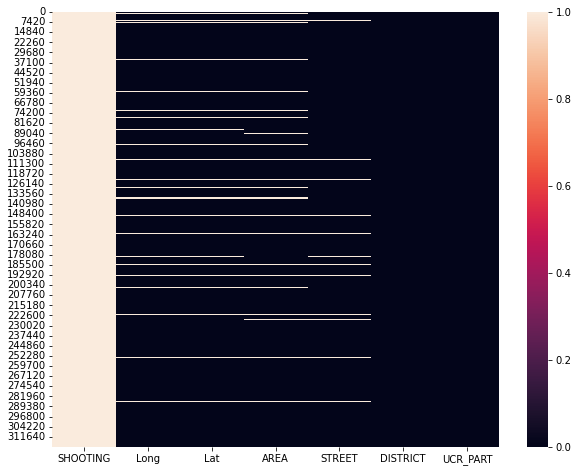

In [43]:
# Density of missing values in the data
plt.figure(figsize=(10,8))
sns.heatmap(df[['SHOOTING','Long','Lat','AREA','STREET','DISTRICT','UCR_PART']].isna())

**Observation**

Handling Missing Values
Untuk menangani missing value, terdapat 2 cara yang dapat dilakukan:

1. Mengisi missing value
2. Menghapus missing value<br>

Hasil dari Investigasi:
* persentase missing value yang sangat tinggi (99.68%) pada kolom `SHOOTING`,
* persentase missing value (6.50%) pada kolom `Long` dan `Lat`,
* persentase missing value (6.35%) pada kolom `AREA`,
* persentase missing value (3.41%) pada kolom `STREET`, 
* persentase missing value (0.55%) pada kolom `DISTRICT`,
* persentase missing value (0.03%) pada kolom `UCR_PART`.

*Keputusan yang diambil adalah Mengisi Missing Value, agar data bisa dianalisis lebih lanjut*

### Handling `SHOOTING` column

Persentase missing value yang sangat tinggi (99.68%) pada kolom *`SHOOTING`* , maka keputusan yang diambil adalah mengisi *missing value* pada kolom *`SHOOTING`* dengan nilai `N`, yang mengindikasikan bahwa kejadian penembakan tidak terjadi pada kasus tersebut.

In [44]:
# get the value count of 'SHOOTING' column
df['SHOOTING'].value_counts()

Y    1019
Name: SHOOTING, dtype: int64

In [45]:
# Imputation missing values with N
df['SHOOTING'].fillna('N', inplace=True)

In [46]:
# Check Count column after imputing the missing values
df['SHOOTING'].value_counts()

N    318031
Y      1019
Name: SHOOTING, dtype: int64

In [47]:
# # The visualization shows that there are no missing values in the 'SHOOTING' column and all values have been imputed with 'N'
# fig = px.pie(df, names='SHOOTING', title='SHOOTING')
# fig.show()

<b> We can see that there are very few cases where a shooting occured in this dataset.

<AxesSubplot:>

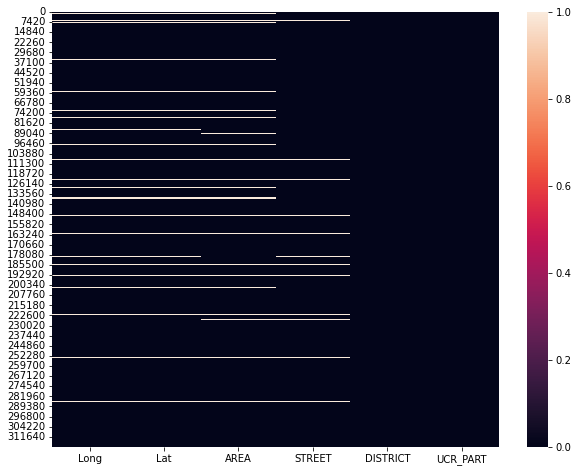

In [48]:
# Density of missing values in the data
plt.figure(figsize=(10,8))
sns.heatmap(df[['Long','Lat','AREA','STREET','DISTRICT','UCR_PART']].isna())

### Handling `UCR_PART` column

Persentase *missing value* yang sangat rendah (0.03%) pada kolom `UCR_PART`, maka keputusan yang diambil adalah mengisi *missing value* tersebut dengan kolom `OFFENSE_CODE`,`CODE`,`OFFENSE_CODE_GROUP` ,`NAME` dari kedua dataset karena keempat kolom tersebut saling terkait dan memiliki ketergantungan satu sama lain dalam klasifikasi dan pelaporan kejahatan.

In [49]:
# Previewing Missing Value in UCR_ART
df[df['UCR_PART'].isna()].head(2)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DESCRIPTION,DISTRICT,AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY,HOUR,UCR_PART,STREET,Lat,Long
1252,I182069560,2010,HOME INVASION,HOME INVASION,South Boston,915,N,2018-08-30 08:19:00,2018,Agust,Thursday,8,NaN,E NINTH ST,42.331463,-71.050126
9214,I182060810,2010,HOME INVASION,HOME INVASION,Hyde Park,493,N,2018-08-01 14:52:00,2018,Agust,Wednesday,14,NaN,REDDY AVE,42.262855,-71.111811


In [50]:
#Finding the total number of offenses between OFFENSE_CODE_GROUP and UCR_PART specifically for the rows that have NaN values
missing_UCRPART = df[df['UCR_PART'].isna()]
missing_UCRPART[['OFFENSE_CODE_GROUP', 'OFFENSE_CODE']].value_counts().reset_index()

,OFFENSE_CODE_GROUP,OFFENSE_CODE,0
0,HOME INVASION,2010,77
1,HUMAN TRAFFICKING,1610,7
2,INVESTIGATE PERSON,3115,4
3,HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE,1620,2


In [51]:
# Checking The OFFENSE_CODE from Crime Dataset
df[(df['OFFENSE_CODE'] == 2010) & df['UCR_PART'].isna()][['OFFENSE_CODE', 'DESCRIPTION', 'UCR_PART']].head(2) # hasil UCR_Part Nan

# Checking The CODE from Offense codes Dataset
of[of['CODE'] == 2010][['CODE', 'NAME']] #belum menemukan hasilnya 

,CODE,NAME
574,2010,HOME INVASION


In [52]:
#Checking The Name above with similar offense names so that we can input their UCR_PARTs
of[of['NAME'].str.contains('HOME', case=False)] # menggunakan code 371 untuk Home Invasion

# Checking again OFFENSE_CODE
df[df['OFFENSE_CODE'] == 371][['OFFENSE_CODE','OFFENSE_CODE_GROUP', 'DESCRIPTION', 'UCR_PART']].head(2) 
# mendapatkan hasil dengan description ROBBERY - HOME INVASION adalah part one

# After finding similar offenses, we can then fill in their UCR_PART values with references from offenses that already have UCR_PART values
df.loc[(df.UCR_PART.isna()) & (df.OFFENSE_CODE_GROUP == "HOME INVASION"), "UCR_PART"] = "Part One"
df.loc[(df.UCR_PART.isna()) & (df.OFFENSE_CODE_GROUP == "HUMAN TRAFFICKING"), "UCR_PART"] = "Part Two"
df.loc[(df.UCR_PART.isna()) & (df.OFFENSE_CODE_GROUP == "INVESTIGATE PERSON"), "UCR_PART"] = "Part Three"
df.loc[(df.UCR_PART.isna()) & (df.OFFENSE_CODE_GROUP == "HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE"), "UCR_PART"] = "Part Two"

df['UCR_PART'].isna().sum()

0

<b> There are no missing values in the `UCR_PART` column

### Handling `geographic` columns

<AxesSubplot:>

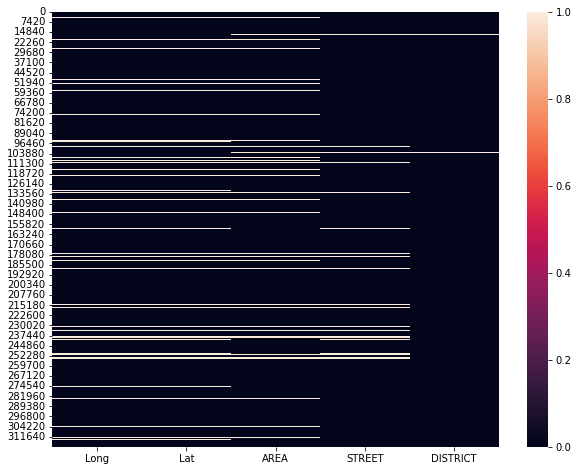

In [53]:
# Density of missing values in the data
plt.figure(figsize=(10,8))
sns.heatmap(df[['Long','Lat','AREA','STREET','DISTRICT']].isna())

secara umum, 

jika terdapat baris dalam dataset yang memiliki nilai `NaN` pada kolom-kolom penting seperti `Long`,`Lat`, `AREA`, `STREET`, dan `DISTRICT`, maka akan tepat untuk menghapus baris-baris tersebut karena nilai `NaN` menunjukkan bahwa data tersebut tidak lengkap atau tidak tersedia untuk dianalisis.

In [54]:
# Displaying the NaN values in columns Long, Lat, AREA, STREET, and DISTRICT
total_NaN = (df['Long'].isnull()) & (df['Lat'].isnull()) & (df['AREA'].isnull()) & (df['STREET'].isnull()) & (df['DISTRICT'].isnull())
total_NaN = (df['Long'].isnull()) & (df['Lat'].isnull()) & (df['AREA'].isnull()) & (df['STREET'].isnull())

# Remove rows with total NaN
df = df.drop(df[(df['Long'].isnull()) & (df['Lat'].isnull()) & (df['AREA'].isnull()) & (df['STREET'].isnull()) & (df['DISTRICT'].isnull())].index)
df = df.drop(df[(df['Long'].isnull()) & (df['Lat'].isnull()) & (df['AREA'].isnull()) & (df['STREET'].isnull())].index)


<AxesSubplot:>

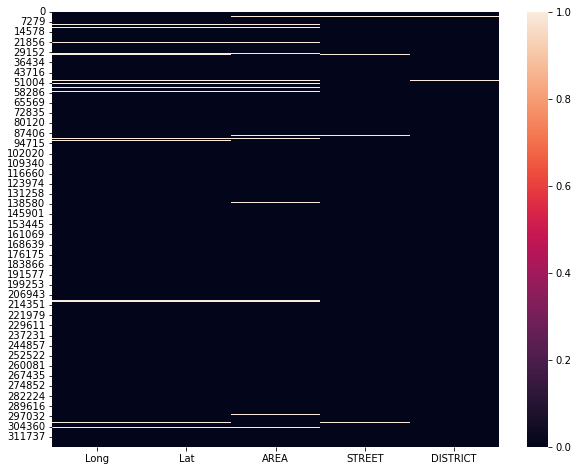

In [55]:
# Density of missing values in the data
plt.figure(figsize=(10,8))
sns.heatmap(df[['Long','Lat','AREA','STREET','DISTRICT']].isna())

Pengisian nilai *Long* , *Lat* berdasarkan informasi *district* atau nama *street* tidak selalu akurat karena terdapat kemungkinan beberapa *street* atau *district* memiliki nama yang sama di daerah yang berbeda Selain itu, ada juga kemungkinan bahwa *street* yang sama melintasi beberapa *district* yang berbeda, beberapa *street* diboston bisa mancakup luas beberapa *district*. Oleh karena itu, mengisi nilai *Long* dan *Lat* dengan cara ini dapat menghasilkan data yang tidak akurat atau menyesatkan.[bisa check disini](https://www.latlong.net/)

In [56]:
# Displaying the NaN values in columns Long, Lat
total_NaN = (df['Long'].isnull()) & (df['Lat'].isnull())

# Remove rows with total NaN
df = df.drop(df[(df['Long'].isnull()) & (df['Lat'].isnull())].index)

<AxesSubplot:>

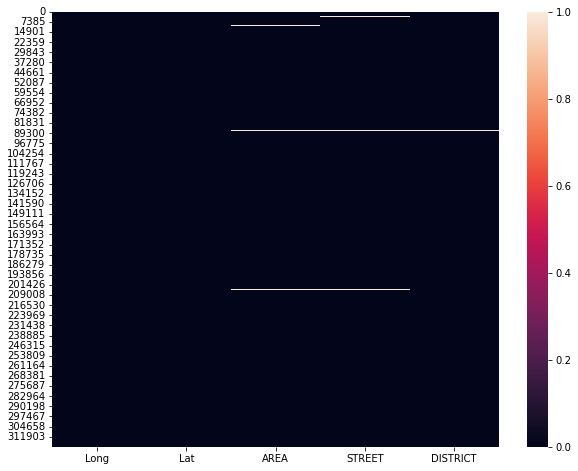

In [57]:
# Density of missing values in the data
plt.figure(figsize=(10,8))
sns.heatmap(df[['Long','Lat','AREA','STREET','DISTRICT']].isna())

kita tidak bisa melakukan imputasi *missing value* kolom `AREA` berdasarkan informasi `Long-Lat`, `street`, dan `district`. Hal ini dikarenakan `Long-Lat`, `street`, dan `district` hanya merepresentasikan titik koordinat pada peta dan tidak selalu memiliki wilayah yang dapat didefinisikan secara jelas dan pasti. Selain itu, ada kemungkinan beberapa `street`, atau `district` memiliki wilayah yang tidak dapat didefinisikan dengan jelas dan ada juga beberapa `street`, atau `district` yang melintasi beberapa wilayah atau *area* yang berbeda. Oleh karena itu, dalam menentukan wilayah (*area*), diperlukan *analisis* yang cermat dan terperinci dengan melibatkan berbagai pihak yang berkompeten dalam bidang pemetaan, pemantauan untuk memperoleh informasi yang lebih lengkap dan akurat.

In [58]:
# Displaying the NaN values in columns Area
total_NaN = df['AREA'].isnull().sum()

# Remove rows with total NaN
df = df.drop(df[df['AREA'].isnull()].index)

<AxesSubplot:>

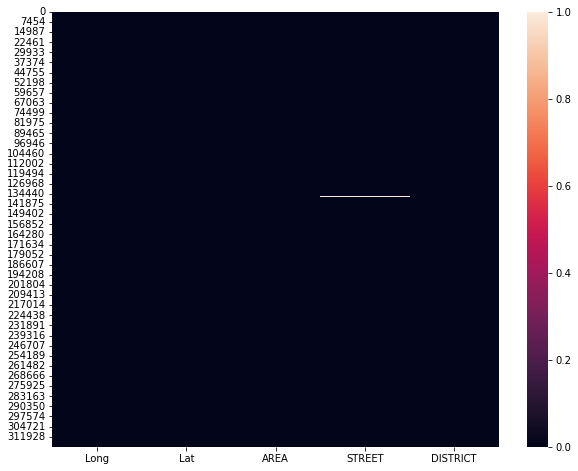

In [59]:
# Density of missing values in the data
plt.figure(figsize=(10,8))
sns.heatmap(df[['Long','Lat','AREA','STREET','DISTRICT']].isna())

In [60]:
# Checking Missing Value 
df[['DISTRICT','AREA','STREET','Long','Lat']].isna().sum()

DISTRICT    13
AREA         0
STREET      89
Long         0
Lat          0
dtype: int64

<b> Selanjutnya kita akan imputasi *missing value District* berdasarkan data *Area*.

In [61]:
# Select rows where 'DISTRICT' column contains missing values and the specified columns
df[df['DISTRICT'].isna()][['INCIDENT_NUMBER','DISTRICT','AREA','STREET','Long','Lat']].head(2)
#df[df['DISTRICT'].isna()]['AREA'].unique()

,INCIDENT_NUMBER,DISTRICT,AREA,STREET,Long,Lat
21664,I182047516,NaN,36,HOTEL DR,-71.024467,42.367377
43081,I182024758,NaN,36,TRANSPORTATION WAY,-71.028878,42.367937


In [62]:
# filling missing values in the "DISTRICT" column based on the values in the "AREA" column.

df.loc[(df.DISTRICT.isna()) & (df.AREA == '36'), "DISTRICT"] = "East Boston"
df.loc[(df.DISTRICT.isna()) & (df.AREA == '32'), "DISTRICT"] = "East Boston"
df.loc[(df.DISTRICT.isna()) & (df.AREA == '611'), "DISTRICT"] = "Roxbury"
df.loc[(df.DISTRICT.isna()) & (df.AREA == '511'), "DISTRICT"] = "Hyde Park"
df.loc[(df.DISTRICT.isna()) & (df.AREA == '26'), "DISTRICT"] = "East Boston"
df.loc[(df.DISTRICT.isna()) & (df.AREA == '714'), "DISTRICT"] = "West Roxbury"

<b> Selanjutnya kita akan imputasi *missing value Street* dengan cara mengisi baris data *Area* dengan berdasarkan informasi [disini](https://bostonopendata-boston.opendata.arcgis.com/datasets/9a3a8c427add450eaf45a470245680fc_5/explore?location=42.312319%2C-71.071800%2C12.00)

In [63]:
# Select rows where 'STREET' column contains missing values and the specified columns
df[df['STREET'].isna()][['INCIDENT_NUMBER','DISTRICT','AREA','STREET','Long','Lat']]
#df[df['STREET'].isna()]['AREA'].unique() 

,INCIDENT_NUMBER,DISTRICT,AREA,STREET,Long,Lat
3316,I182067259,Roxbury,259,NaN,-71.080572,42.305451
4358,I182066138,Roxbury,259,NaN,-71.080572,42.305451
4422,I182066071,Roxbury,259,NaN,-71.080572,42.305451
14122,I182055504,Roxbury,259,NaN,-71.080572,42.305451
16851,I182052623,Roxbury,259,NaN,-71.080572,42.305451
...,...,...,...,...,...,...
238634,I162029555,Roxbury,259,NaN,-71.080572,42.305451
242256,I162025668,Roxbury,259,NaN,-71.080572,42.305451
242257,I162025668,Roxbury,259,NaN,-71.080572,42.305451
245821,I162021879,Roxbury,259,NaN,-71.080572,42.305451


In [64]:
# Manually filling in missing values in the 'STREET' column
df.loc[(df.STREET.isna()) & (df.AREA == '259' ), "STREET"] = "Brocks Gap Road"
df.loc[(df.STREET.isna()) & (df.AREA == '319' ), "STREET"] = "SEAVER ST"
df.loc[(df.STREET.isna()) & (df.AREA == '171' ), "STREET"] = "HARRISON AVE"

In [65]:
# Check After Imput Mising value 
df[['DISTRICT','AREA','STREET','Long','Lat']].isna().sum()

DISTRICT    0
AREA        0
STREET      0
Long        0
Lat         0
dtype: int64

## Handling Outlier

**Observation**

Dalam analisis ini, *handling outlier* tidak diperlukan karena kebanyakan data pada kolom-kolom yang terkait dengan kejahatan seperti `INCIDENT_NUMBER`, `CODE`, `DATE`, `TIME`, `LOKASI/AREA`, dan jenis kejahatan sudah memiliki *range* atau nilai yang dapat diterima secara umum. Oleh karena itu, data-data yang berada di luar *range* tersebut atau nilai yang dianggap *ekstrim* tidak perlu dihapus atau dilakukan *handling outlier*.

## Hypothesis Testing

In [66]:
# Normality test
from scipy.stats import normaltest
columns = ['OFFENSE_CODE','YEAR','HOUR']

for col in columns:
    stat, pval = normaltest(df[col])
    print(f'{col}: p-value = {pval:.5f}')
    if pval < 0.05:
        print(f'{col}: Data TIDAK terdistribusi normal')
    else:
        print(f'{col}: Data terdistribusi normal')

OFFENSE_CODE: p-value = 0.00000
OFFENSE_CODE: Data TIDAK terdistribusi normal
YEAR: p-value = 0.00000
YEAR: Data TIDAK terdistribusi normal
HOUR: p-value = 0.00000
HOUR: Data TIDAK terdistribusi normal


### Analysis of variance (ANOVA)

Tujuan dari *`pengujian hipotesis`* adalah membuktikan suatu pernyataan umum dengan menggunakan data - data sampel yang ada.<br> 
Pada Pengujian ini, kita ingin mengetahui apakah terdapat perbedaan yang signifikan antara rata-rata tahun dari `tipe kejahatan` di Boston berdasarkan *`UCR_PART`.<bR>*
+ <b> (H0) menyatakan bahwa tidak ada perbedaan signifikan antara rata-rata `Year` dari tipe kejahatan di Boston berdasarkan `UCR_Part`<br> <b> 
+ <b> (H1) menyatakan bahwa setidaknya ada satu kelompok `UCR_Part` yang berbeda secara signifikan dari `UCR_PART` yang lain dalam rata-rata tahun kejahatan di Boston <br> <b> 

Untuk menguji kedua hipotesis tersebut, kita akan menggunakan `uji ANOVA`, yang merupakan salah satu metode *inferensial* untuk membandingkan rata-rata dari tiga kelompok atau lebih dan menentukan apakah perbedaan antara kelompok tersebut signifikan secara *statistik*.

In [67]:
# using ANOVA (Analysis of Variance) test".
data = df[['UCR_PART', 'YEAR']]

# Splitting the data into groups for testing
group1 = data[data['UCR_PART'] == 'Part One']['YEAR']
group2 = data[data['UCR_PART'] == 'Part Two']['YEAR']
group3 = data[data['UCR_PART'] == 'Part Three']['YEAR']
group4 = data[data['UCR_PART'] == 'Other']['YEAR']

# Importing One Way Anova from scipy 
f_statistic, p_value = stats.f_oneway(group1, group2, group3, group4)

# Display the Result 
print('F-Statistic:', f_statistic)
print('P-value:', p_value)

# Conclusion 
if p_value < 0.05:
    print('Hipotesis nol (H0) ditolak')
    print('Hipotesis alternatif (H1) diterima')
else:
    print('Hipotesis nol (H0) diterima')
    print('Hipotesis alternatif (H1) ditolak')


F-Statistic: 290.384753234672
P-value: 3.02500366973352e-188
Hipotesis nol (H0) ditolak
Hipotesis alternatif (H1) diterima


**Observation**

+ Karena P- Value kurang dari tingkat signifikan kita 0.05 artinya kita memiliki cukup bukti untuk menolak *Hipotesis Nol*.
+ Dengan demikian, kita dapat menyimpulkan bahwa setidaknya ada satu kelompok yang memiliki rata-rata yang berbeda secara signifikan dari kelompok *`UCR_PART`.*

## Save Data

Simpan dataset bersih untuk dilakukan visualisasi dalam *Tableau*.

In [68]:
#df.to_excel("Final_Crime.xlsx")  

# <b> Data Analysis 

Setelah ***data cleaning*** dilakukan, Selanjutnya kita bisa mulai melakukan analisis untuk dapat menjawab ***probelm statement*** dibawah ini:
1. Jenis kejahatan apa yang paling sering terjadi di Boston?
2. Di daerah manakah kejahatan paling banyak terjadi?
3. Berapa banyak frekuensi kejahatan yang terjadi berdasarkan tahun,bulan dan hari?
4. Kapan waktu kejahatan sering terjadi?
5. kapan dan dimana terjadi penembakan? dan apa jenis kejahatannya?
6. Apakah kejahatan meningkat atau menurun selama beberapa tahun terakhir? 

## Question 1

## What types of crimes occur most frequently in Boston?

### Types of Crimes

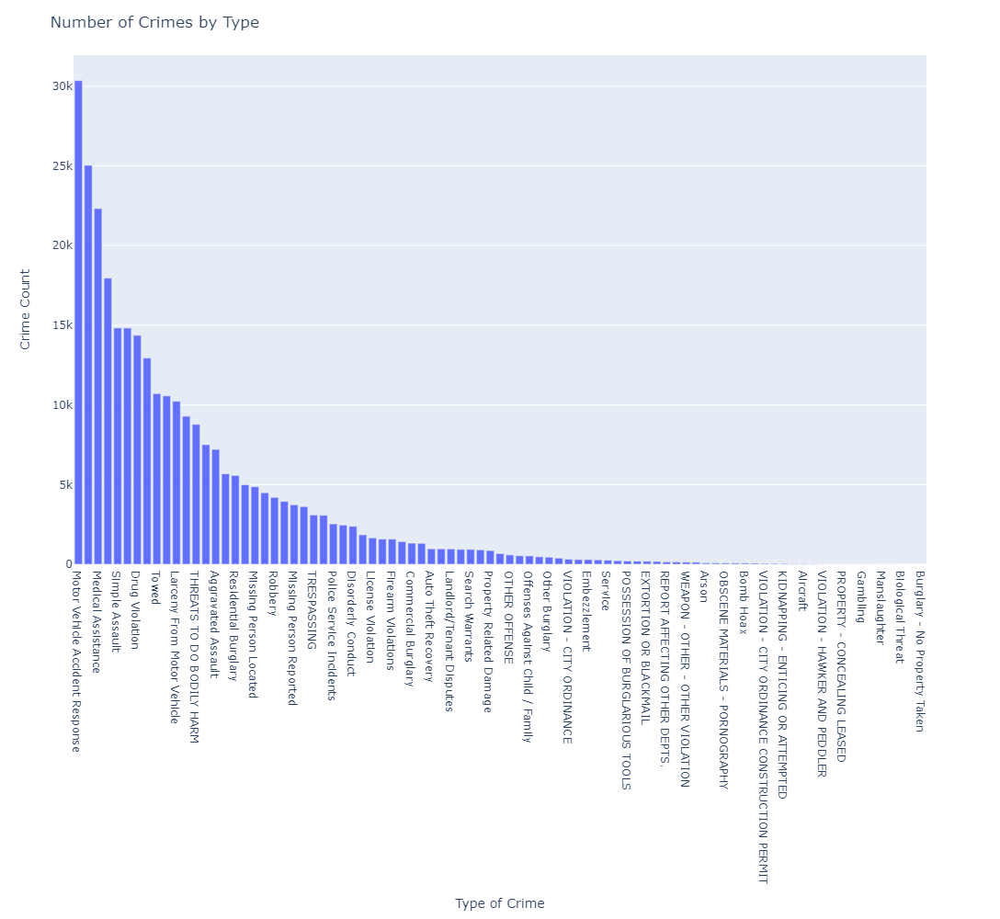

In [69]:
#Following bar plot shows the total number of crimes based on their types in descending order
count_by_offense = df['OFFENSE_CODE_GROUP'].value_counts()
fig = px.bar(count_by_offense, x=count_by_offense.index, y=count_by_offense.values)
fig.update_layout(title='Number of Crimes by Type',
                        xaxis_title='Type of Crime',
                        yaxis_title='Crime Count',width=1000, height=1000)
fig.show()

 <b> *Dari data 296222 kasus terbanyak adalah Motor Vehicle Accident Response*

### Types of Crime based on `UCR_PART`

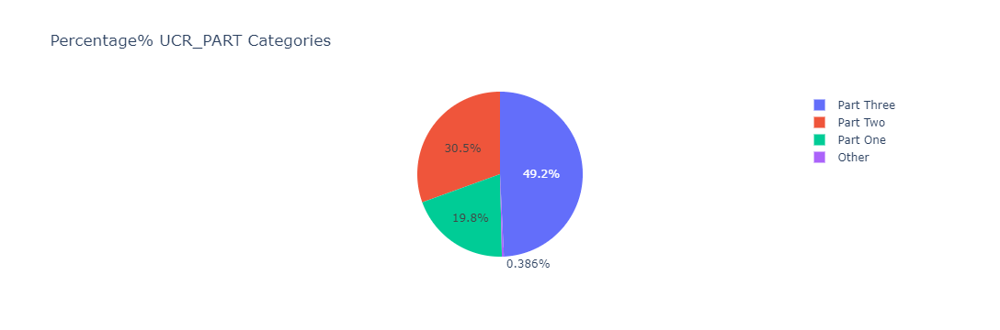

In [70]:
#count the frequency of each category
ucr_part_counts = df['UCR_PART'].value_counts().reset_index()
fig = px.pie(ucr_part_counts, values='UCR_PART', names='index', 
             title ='Percentage% UCR_PART Categories')
fig.show()
#fig.write_image("totalucr.jpg")

| UCR_PART | Description
| ----- | ---------- |
Part 1 | meliputi kejahatan yang serius seperti pembunuhan, pemerkosaan, perampokan, perampokan dengan kekerasan, kekerasan yang disebabkan oleh senjata api, perampokan kendaraan bermotor, pencurian kendaraan bermotor, dan pencurian dengan kekerasan.
Part 2 | meliputi kejahatan yang tidak termasuk dalam Part 1 seperti penyerangan, pemerasan, kejahatan siber, kejahatan properti, penyalahgunaan narkoba, pelanggaran perjalanan, dan kejahatan lainnya.
Part 3 | meliputi kejahatan yang dilaporkan oleh korban seperti kekerasan dalam rumah tangga, pelecehan seksual, dan penganiayaan.
Part 4 | meliputi data tentang kejahatan seperti kerusuhan, terorisme, penyalahgunaan kekuasaan oleh petugas keamanan, dan tindak kriminal yang terkait dengan gangguan keamanan publik.

<b> *Dari data 296222 kasus terbanyak adalah UCR_PART Three*

#### `UCR_PART` ONE

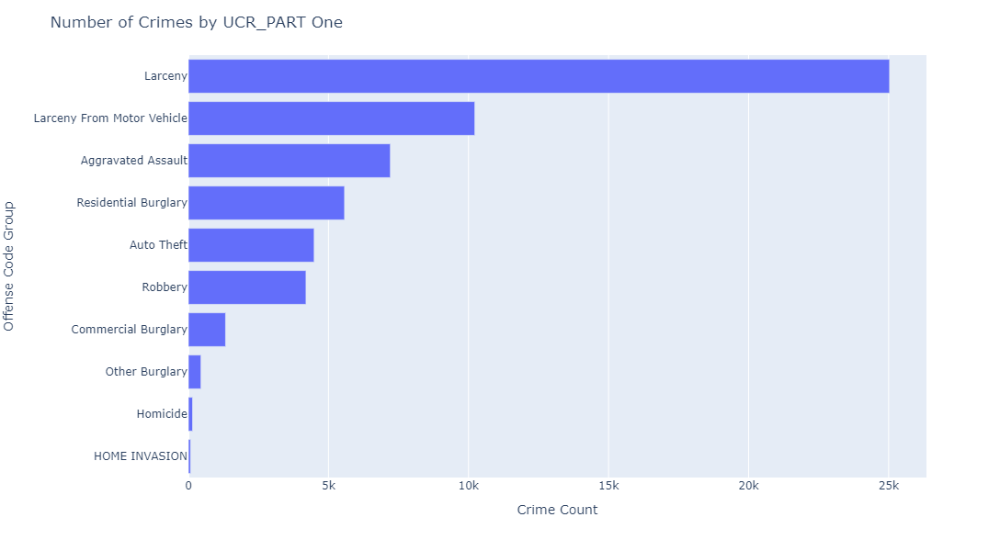

In [71]:
#Let's start by checking the frequency of different types of crimes UCR Part One 
import plotly.express as px

df1 = df[df["UCR_PART"]=='Part One']
count_by_offense = df1['OFFENSE_CODE_GROUP'].value_counts().sort_values(ascending= True)
fig = px.bar(count_by_offense, x=count_by_offense.values, y=count_by_offense.index, orientation='h')
fig.update_layout(title='Number of Crimes by UCR_PART One',
xaxis_title='Crime Count',
yaxis_title='Offense Code Group',width=800, height=600)
fig.show()

<b> Kasus terbanyak *Part One* adalah `Larceny` (tindakan mencuri atau mengambil properti orang lain. Contohnya mencuri ponsel atau tas seseorang).

#### `UCR_PART` TWO

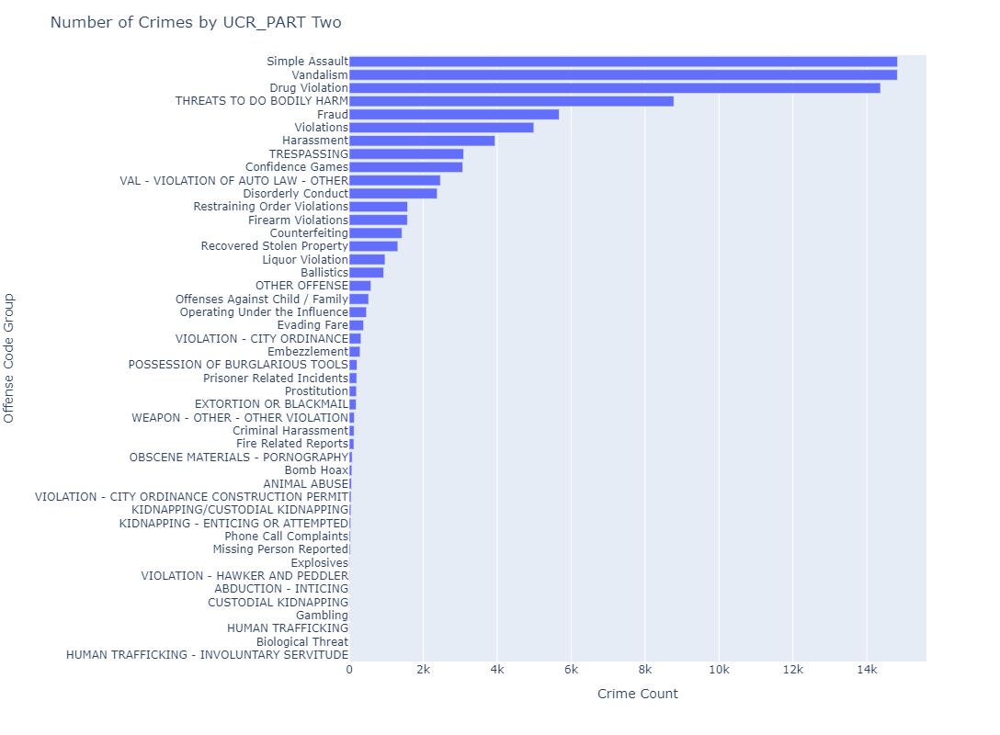

In [72]:
#Let's start by checking the frequency of different types of crimes UCR Part Two 
df2 = df[df["UCR_PART"]=='Part Two']
count_by_offense = df2['OFFENSE_CODE_GROUP'].value_counts().sort_values(ascending= True)
fig = px.bar(count_by_offense, x=count_by_offense.values, y=count_by_offense.index, orientation='h')
fig.update_layout(title='Number of Crimes by UCR_PART Two',
                  xaxis_title='Crime Count',
                  yaxis_title='Offense Code Group',width=1200, height=800)
fig.show()

<b> Kasus terbanyak *Part Two* adalah `Simple assault` (tindakan yang menyebabkan rasa sakit atau cedera ringan pada orang lain, tanpa penggunaan senjata atau ancaman kekerasan serius. Tindakan ini dapat mencakup pukulan, tendangan, tusukan, atau cedera lainnya).

#### `UCR_PART` THREE

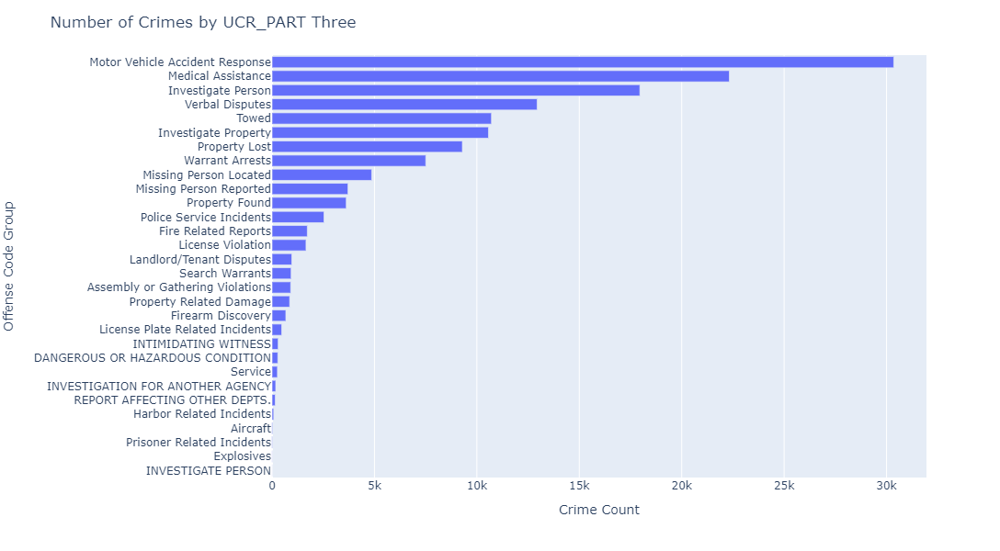

In [73]:
#Let's start by checking the frequency of different types of crimes UCR Part Three 
df3 = df[df["UCR_PART"]=='Part Three']
count_by_offense = df3['OFFENSE_CODE_GROUP'].value_counts().sort_values(ascending= True)
fig = px.bar(count_by_offense, x=count_by_offense.values, y=count_by_offense.index, orientation='h')
fig.update_layout(title='Number of Crimes by UCR_PART Three',
                xaxis_title='Crime Count',
                yaxis_title='Offense Code Group',width=1000, height=600)
fig.show()

<b> Kasus terbanyak *Part Three* adalah `Motor Vehicle Accident Response`(tindakan yang dilakukan untuk merespons kecelakaan kendaraan bermotor. Tujuannya adalah untuk memberikan pertolongan pertama kepada korban, mengamankan area kecelakaan, dan memulihkan lalu lintas secepat mungkin).

#### `UCR_PART` OTHER

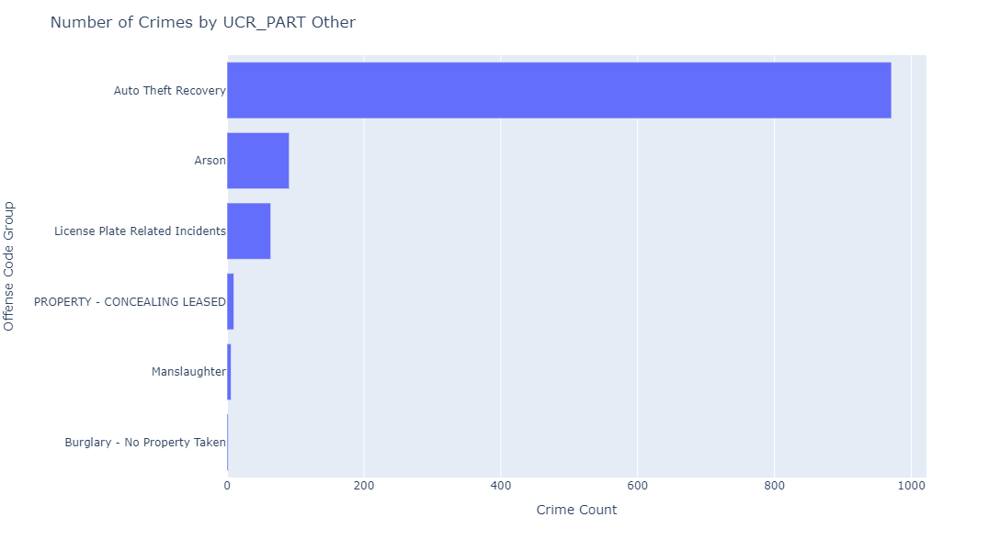

In [74]:
#Let's start by checking the frequency of different types of crimes UCR Part Other
df4 = df[df["UCR_PART"]=='Other']
count_by_offense = df4['OFFENSE_CODE_GROUP'].value_counts().sort_values(ascending= True)
fig = px.bar(count_by_offense, x=count_by_offense.values, y=count_by_offense.index, orientation='h')
fig.update_layout(title='Number of Crimes by UCR_PART Other',
                    xaxis_title='Crime Count',
                    yaxis_title='Offense Code Group',width=800, height=600)
fig.show()

<b> Kasus terbanyak *Part Other* adalah `Auto theft recovery` (proses mengambil kembali kendaraan bermotor yang dicuri atau hilang dengan cara tidak sah. Ini dapat dilakukan oleh lembaga penegak hukum atau perusahaan asuransi yang memulihkan kendaraan yang dicuri untuk dikembalikan kepada pemilik aslinya).

###  Showing scatter plot the locations of crime incidents

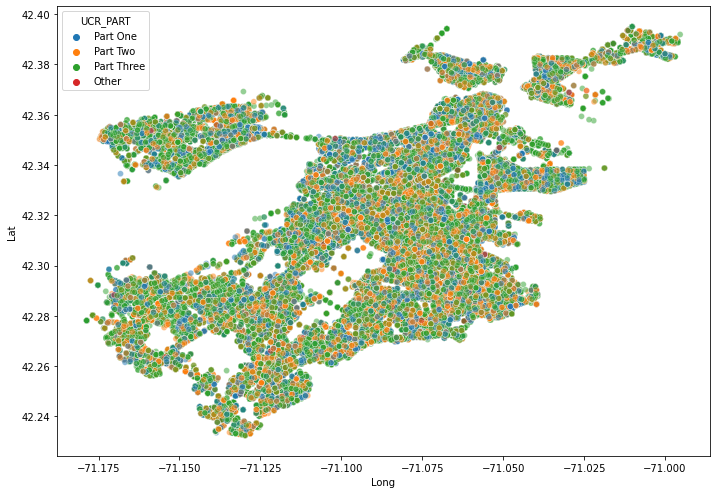

In [75]:
# Making Scatterplot the location with UCR_PART
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
sns.scatterplot(x='Long', y='Lat', hue='UCR_PART', alpha=0.5, data=df, ax=ax)
plt.show()

Dalam *scatter plot* di atas, sumbu *x* menunjukkan nilai *longitude* dan sumbu *y* menunjukkan nilai *latitude*. Warna titik-titik pada plot merepresentasikan kategori *UCR Part* yang berbeda. dengan visualisasi ini memudahkan kita melihat *area* di mana titik-titik kejahatan yang tumpang tindih.

## Question 2

## In which area most crimes are committed?

### Crime Count by `district`

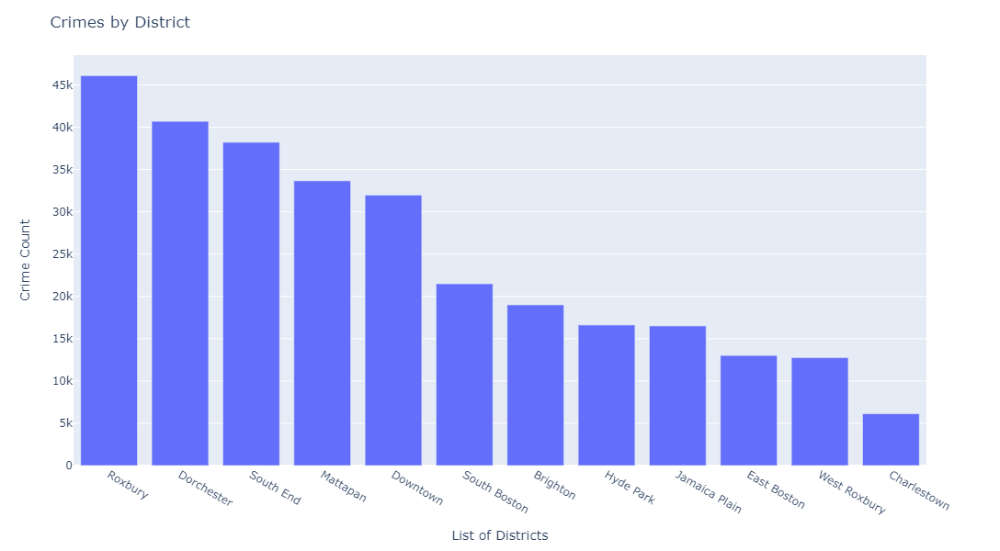

In [76]:
#Following bar plot shows the total number of crimes based on their types in descending order by districts.
count_by_district = df['DISTRICT'].value_counts()
fig = px.bar(count_by_district, x=count_by_district.index, y=count_by_district.values)
fig.update_layout(title='Crimes by District',
    xaxis_title='List of Districts',
    yaxis_title='Crime Count',width=800, height=600)
fig.show()

<b> District tertinggi dalam tingkat kejahatan adalah `Roxbory , Docrchester, dan South End`
* *Roxbury* sering mengalami insiden karena merupakan salah satu daerah yang paling padat penduduknya di *Boston*.
* *Dorchester* memiliki tingkat kemiskinan yang tinggi, dengan lebih dari seperempat dari penduduknya hidup di bawah garis kemiskinan. Tingkat kemiskinan yang tinggi dapat meningkatkan risiko terjadinya kejahatan.
* *South End*: Terletak di pusat kota *Boston, South End* merupakan daerah yang terkenal dengan kehidupan malamnya yang ramai.


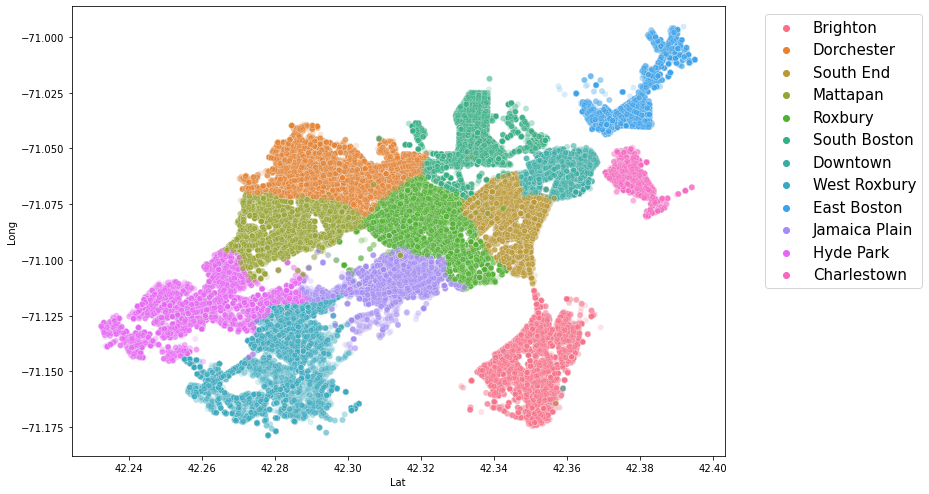

In [77]:
# Plot districts
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
sns.scatterplot(x=df['Lat'],
               y=df['Long'],
                hue= df['DISTRICT'],
                alpha=0.2,
               data=df, ax=ax)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, fontsize=15)

Terlihat bahwa kejadian kriminal tersebar di berbagai daerah di *Boston*. Beberapa daerah terlihat lebih banyak kejadian kriminalnya dibandingkan daerah lain, seperti *district Dorchester, South End, dan Roxbury*. Terdapat *variasi* warna pada titik-titik pada plot, yang menunjukkan kejadian kriminal yang terjadi pada setiap *district* di *Boston*.

### Crime Count by `Street`

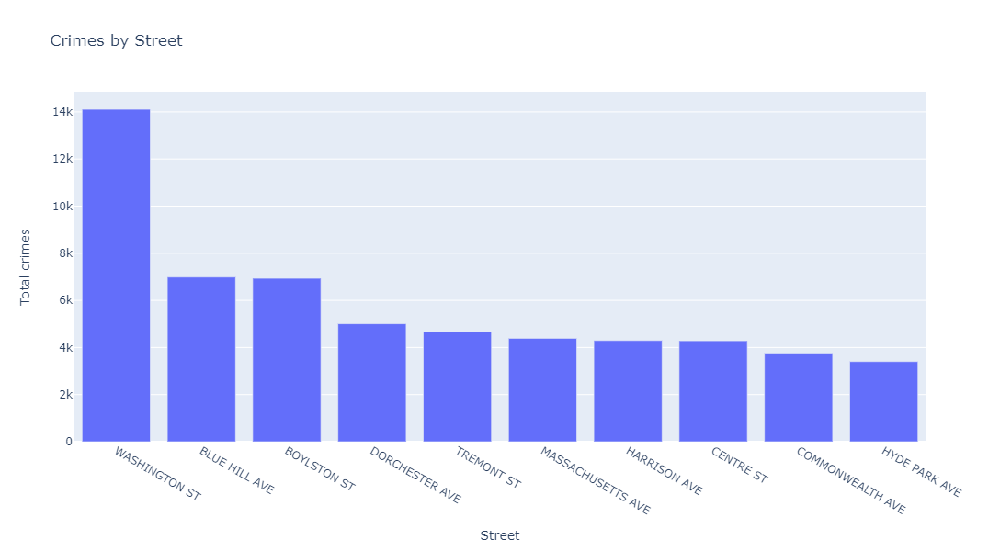

In [78]:
# Following bar plot shows the total number of crimes based on their types in descending order by top Street
top_10 = df['STREET'].value_counts()[:10]
fig = make_subplots()
fig.add_trace(go.Bar(
        x=top_10.index,
        y=top_10.values,
        name='Total crimes'))
fig.update_layout(
    title='Crimes by Street',
    xaxis_title='Street',
    yaxis_title='Total crimes',width=800, height=600)
fig.show()

<b> Street tertinggi tingkat kejahatannya adalah Washington ST, Blue Hill Ave , dan Boylston ST.<br> 
    
*Washington St* sebagai *street* yang memiliki tingkat kejahatan tertinggi. karena *Washington St* adalah jalan utama yang melintasi beberapa *district* di *Boston, Massachusetts*. Jalan ini melintasi beberapa distrik termasuk *Roxbury*, *Dorchester*, *Jamaica Plain*, *West Roxbury*, dan *Brighton*.

### Crime by `MAPS`

In [79]:
# Create basic Folium crime map
crime_map = folium.Map(location=[42.3125,-71.0875], 
                       tiles = "Stamen Toner",
                      zoom_start = 11)

# Add data for heatmp 
data_heatmap = df['YEAR']
data_heatmap = df[['Lat','Long']]
data_heatmap = df.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=10).add_to(crime_map)

# Plot!
crime_map

## Question 3

## How many crime frequencies occurred by year, month, and day?

### Crime Count by `Year`

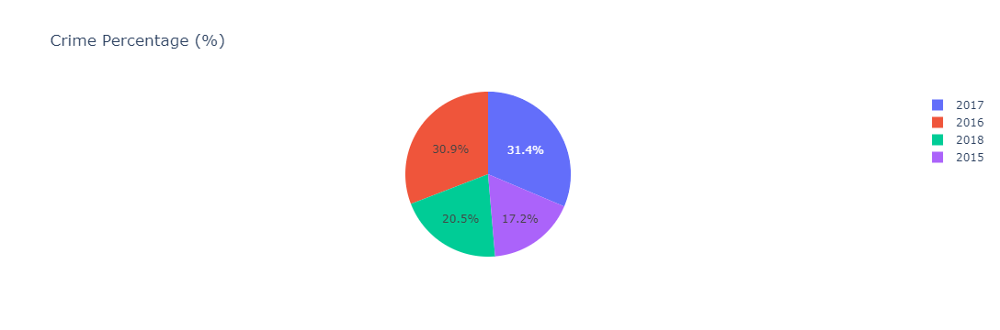

In [80]:
# Show the percentage of crimes by year
df_year_count = df.YEAR.value_counts().reset_index()
df_year_count.columns = ['YEAR', 'Count']
fig = px.pie(df_year_count, values='Count', names='YEAR', title='Crime Percentage (%)')
fig.show()

<b> Dari Data 296222 Kasus terbanyak terjadi pada tahun 2017, karena data yang tersedia terbatas untuk tahun 2015 dan 2018.

### Crime Count by `Year` based UCR_PART

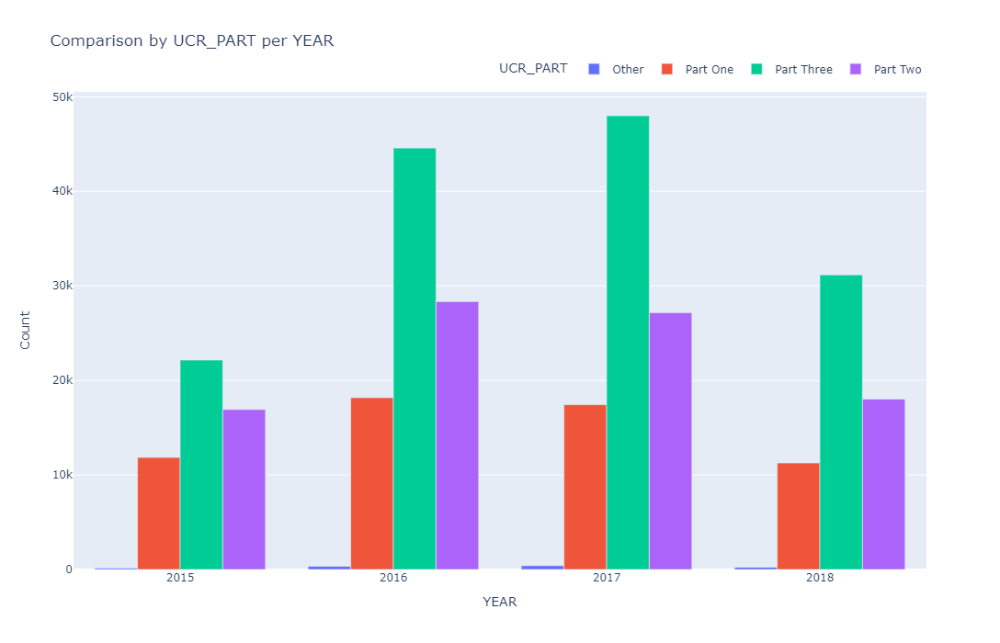

In [81]:
# Crime Count UCRT_part per Year
import plotly.express as px

crime_UCR = df.groupby(['YEAR', 'UCR_PART'])['UCR_PART'].count().reset_index(name='count')
fig = px.bar(crime_UCR, x='YEAR', y='count', color='UCR_PART', title='Comparison by UCR_PART per YEAR', barmode='group')
fig.update_layout(
    xaxis=dict(tickmode='linear', dtick=1),
    yaxis=dict(title='Count'),
    font=dict(size=12),
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    height=700) # menentukan tinggi grafik)
fig.show()

<b> The analysis result based on the visualization

* Ditemukan Part Other dan Part Three mengalami kenaikan setiap tahun 2015 -2017 lalu turun di tahun 2018 <br>
* Terlihat juga bahwa sejak 2016 - 2017 Part One dan Part Two mengalami Penurunan, lalu turun di tahun 2018 <br> 

### Crime Count by `Month`

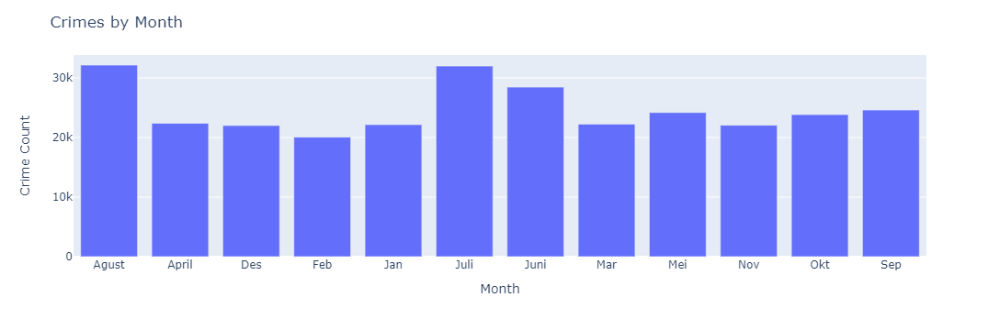

In [82]:
import plotly.express as px

# Count the number of crimes by month
count_by_month = df['MONTH'].value_counts().sort_index()
fig = px.bar(x=count_by_month.index, y=count_by_month.values)
fig.update_xaxes(title_text='Month')
fig.update_yaxes(title_text='Crime Count')
fig.update_layout(title='Crimes by Month')

# Show the figure
fig.show()


<b> Puncak kejahatan terbanyak terjadi dibulan Juni , Juli dan Agustus.<br>
    
*Juni, Juli, dan Agustus* merupakan musim panas di *Boston*.  *Visualisasi* diatas membuktikan bahwa insiden banyak terjadi dimusim panas ketimbang musim lainnya.
kemungkinan bisa disebabkan karena lebih banyak orang yang beraktivitas di luar ruangan dan meningkatnya kerumunan di area publik selama musim panas, sehingga memicu terjadinya kejahatan.

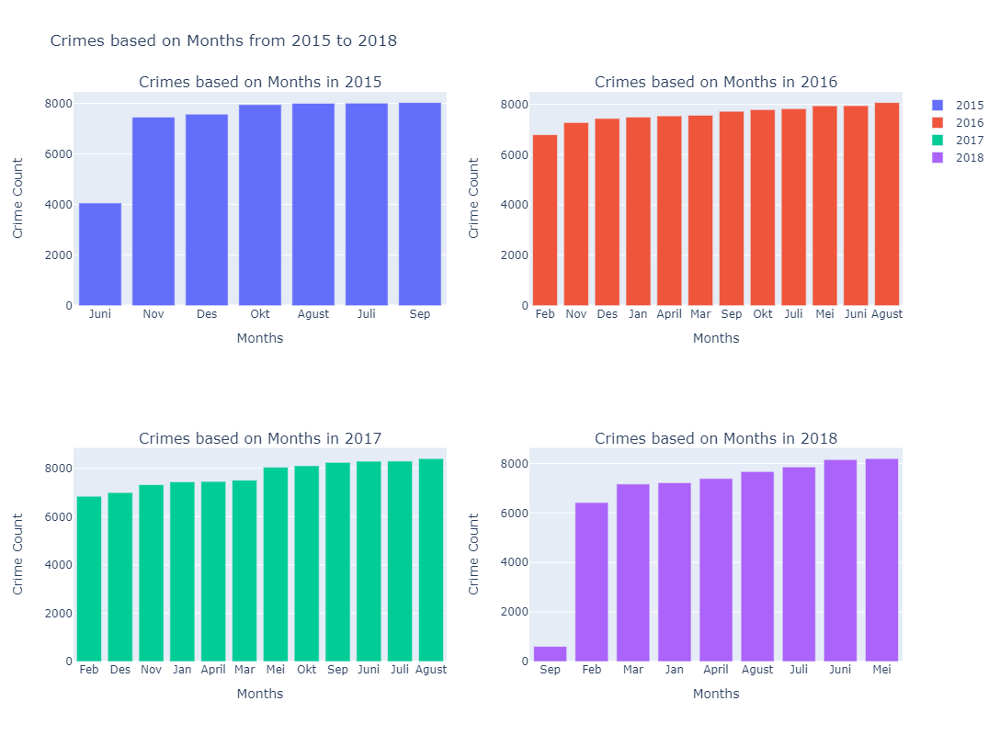

In [83]:
#Show the frequency of the number of crimes by month per year 
fig = make_subplots(rows=2, cols=2, subplot_titles=('Crimes based on Months in 2015', 
                                                    'Crimes based on Months in 2016', 
                                                    'Crimes based on Months in 2017',
                                                    'Crimes based on Months in 2018'))
for i, year in enumerate(range(2015, 2019)):
    row = i // 2 + 1
    col = i % 2 + 1
    df_year = df[df['YEAR'] == year]  # filter data for current year only
    count_by_month = df_year['MONTH'].value_counts().sort_values(ascending=True) # count crimes by month and sort by month order
    fig.add_trace(go.Bar(x=count_by_month.index, y=count_by_month.values, name=f'{year}'),
                  row=row, col=col)
    fig.update_xaxes(title_text='Months', row=row, col=col)
    fig.update_yaxes(title_text='Crime Count', row=row, col=col)
fig.update_layout(title='Crimes based on Months from 2015 to 2018', width=1000, height=800)
fig.show()

<b> The analysis result based on the visualization

* Bulan Juni 2015 terdapat jumlah kejahatan paling rendah dibandingkan dengan bulan-bulan lainnya<br>
* Terlihat juga bahwa bahwa bulan-bulan lain memiliki jumlah kejahatan yang hampir sama (tidak mengalami kenaikan mapun penurunan)<br> 
* Pada bulan September 2018 terjadi penurunan yang signifikan dalam jumlah kejahatan<br> 

### Crime Count by `Day`

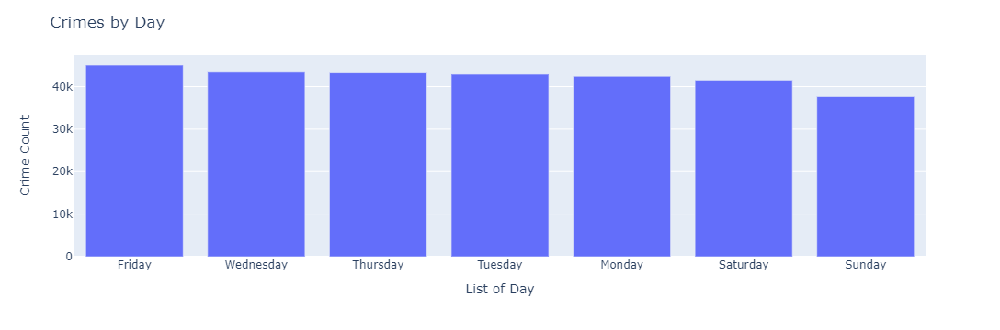

In [84]:
#Show the frequency of the number of crimes by Day
count_by_day = df['DAY'].value_counts()
fig = px.bar(count_by_day, x=count_by_day.index, y=count_by_day.values)
fig.update_layout(
    title='Crimes by Day',
    xaxis_title='List of Day',
    yaxis_title='Crime Count')
fig.show()

<b> Tidak terdapat perbedaan signifikan jumlah kejahatan antara hari-hari dalam seminggu. 

## Question 4

## When do crimes often occur? 

### Number of Crimes for each Time Period

#### Crimes Count by `Hour`

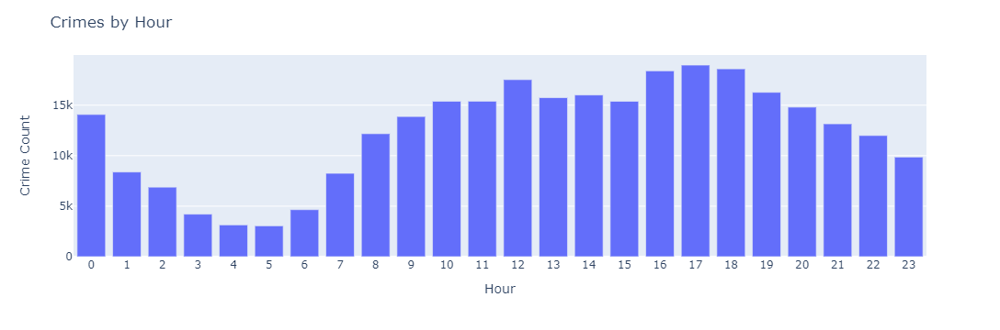

In [85]:
# Following plot shows the total number of crimes based on the hour of day
count_by_hour = df['HOUR'].value_counts()
fig = px.bar(count_by_hour, x=count_by_hour.index, y=count_by_hour.values)
fig.update_layout(
    title='Crimes by Hour',
    xaxis_title='Hour',
    yaxis_title='Crime Count',
    xaxis=dict(tickmode='linear',dtick=1))
fig.show()

<b> Tingkat kejahatan rendah antara jam 1-8 pagi, dan secara bertahap meningkat sepanjang hari, memuncak sekitar jam 4-6 sore <b> 

#### Daily Crime Count

[Text(0, 0, '2016-09-01'),
 Text(1, 0, '2016-01-01'),
 Text(2, 0, '2017-09-01'),
 Text(3, 0, '2017-09-22'),
 Text(4, 0, '2018-06-15'),
 Text(5, 0, '2017-09-15'),
 Text(6, 0, '2017-05-16'),
 Text(7, 0, '2017-08-04'),
 Text(8, 0, '2017-09-08'),
 Text(9, 0, '2017-02-24'),
 Text(10, 0, '2016-09-16'),
 Text(11, 0, '2018-05-02'),
 Text(12, 0, '2016-04-01'),
 Text(13, 0, '2018-06-14'),
 Text(14, 0, '2017-08-01'),
 Text(15, 0, '2015-09-25'),
 Text(16, 0, '2017-06-28'),
 Text(17, 0, '2017-06-16'),
 Text(18, 0, '2016-11-01'),
 Text(19, 0, '2015-09-19'),
 Text(20, 0, '2018-05-23'),
 Text(21, 0, '2018-06-25'),
 Text(22, 0, '2016-05-31'),
 Text(23, 0, '2017-06-13'),
 Text(24, 0, '2017-06-15'),
 Text(25, 0, '2017-05-19'),
 Text(26, 0, '2018-05-04'),
 Text(27, 0, '2015-10-23'),
 Text(28, 0, '2017-08-03'),
 Text(29, 0, '2016-10-08')]

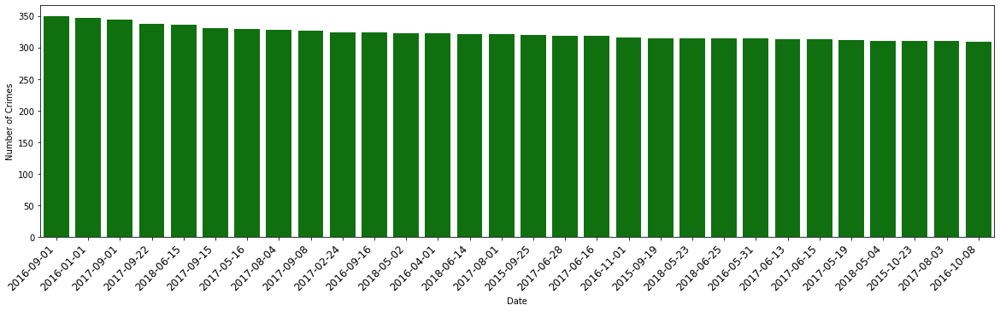

In [86]:
# split DATE into date and time
df['DATE'] = [d.date() for d in df['OCCURRED_ON_DATE']]
df['TIME'] = [d.time() for d in df['OCCURRED_ON_DATE']]

# get the number of crimes for each day
crime_count_by_date = pd.DataFrame(df.groupby('DATE').size().sort_values(ascending=False).rename('COUNT').reset_index())

# create the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 5))
# plot the graph of number of crimes vs. date
# First 30 maximum number of crimes will be plotted
barplot_daily = sns.barplot(x="DATE", y="COUNT", data=crime_count_by_date.iloc[:30, :], color="g")
# set the axis labels
ax.set(ylabel="Number of Crimes", xlabel="Date")
# rotate xticklabels
barplot_daily.set_xticklabels(barplot_daily.get_xticklabels(),
                        rotation=45,
                        horizontalalignment='right',
                        fontweight='light',
                        fontsize='large')

<b> The analysis result based on the visualization
    
Dapat di lihat insiden kejahatan terbanyak pada tanggal *01-09-2016* dan *01-09-2017* dengan jumlah insiden terbanyak pada tanggal yang sama namun berbeda tahun. hal ini dikarenakan adanya konser musik [informasi disni](https://www.concertarchives.org/bands/boston?year=2016). Secara umum, konser atau acara besar dapat menyebabkan peningkatan kerumunan dan kepadatan orang di satu tempat yang dapat meningkatkan risiko insiden kejahatan terjadi.

## Question 5

## When and where did the shooting occur? What type of crime was it?

### Number of Shooting by year

Penembakan terbanyak ditahun 2017


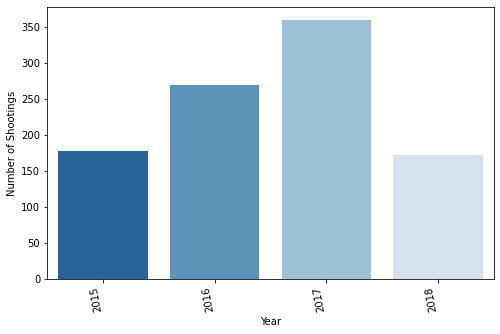

In [87]:
# calculate number of shootings per year
shootings_year_group = df.loc[df['SHOOTING'] == 'Y'].groupby(['YEAR'])['INCIDENT_NUMBER'].count()
print('Penembakan terbanyak ditahun', shootings_year_group.idxmax())

# plot the graph of number of shootings vs. year
shootings_year_group = df.loc[df['SHOOTING'] == 'Y'].groupby(['YEAR'])['INCIDENT_NUMBER'].count().reset_index(name='COUNT')
fig, ax = plt.subplots(figsize=(8, 5))
# plot the graph of number of shootings vs. year
sns.barplot(x="YEAR", y="COUNT", data=shootings_year_group, palette='Blues_r', ax=ax)
ax.set(ylabel="Number of Shootings", xlabel="Year")
ax.set_xticklabels(ax.get_xticklabels(), rotation=100, ha='right')
plt.show()

<b> Penembakan terbanyak di tahun 2016 dan 2017<br>
    
Mungkin peningkatan jumlah penembakan pada tahun 2016 dan 2017 dapat dipengaruhi oleh keterbatasan data pada tahun 2015 dan 2018 yang tidak lengkap.

### Number of Shooting by District

District with most shootings is Roxbury


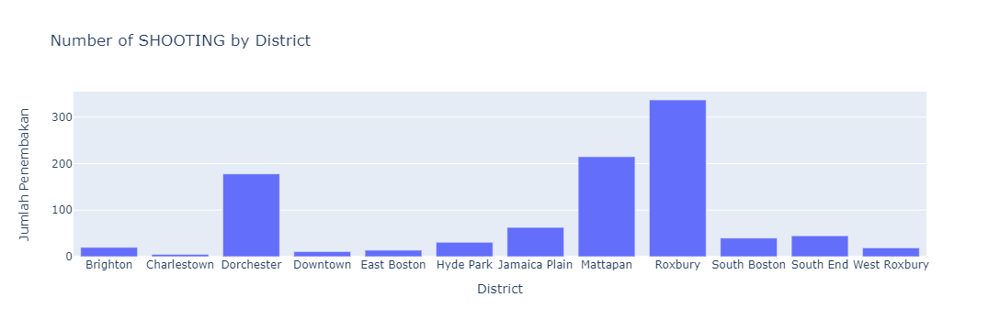

In [88]:
# calculate number of shootings per District
shootings_distr_group = df.loc[df['SHOOTING'] == 'Y'].groupby(['DISTRICT'])['INCIDENT_NUMBER'].count()
print('District with most shootings is', shootings_distr_group.idxmax())

# plot the graph of number of shootings vs. year
shootings_distr_group = df.loc[df['SHOOTING'] == 'Y'].groupby(['DISTRICT'])['INCIDENT_NUMBER'].count()
fig = go.Figure([go.Bar(x=shootings_distr_group.index, y=shootings_distr_group.values)])
fig.update_layout(title='Number of SHOOTING by District', xaxis_title='District', yaxis_title='Jumlah Penembakan')
fig.show()

<b> District yang sering mengalami penembakan adalah Roxbury, Mattapan dan Dorchester

## types of crimes shooting

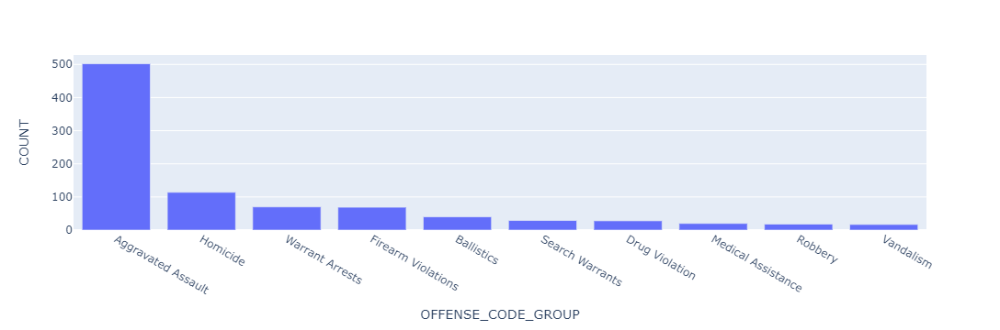

In [89]:
# calculating shootings based on the type of offense
shootings = df[df['SHOOTING'] == 'Y']# Filter hanya data yang berkaitan dengan penembakan
grouped = shootings.groupby(['OFFENSE_CODE_GROUP']) # Group data berdasarkan Offense Code dan lokasi penembakan
counts = grouped.size().reset_index(name='COUNT') # Hitung jumlah kejadian untuk setiap Offense Code
top_10 = counts.sort_values('COUNT', ascending=False).head(10) # Urutkan berdasarkan COUNT dari yang terbesar ke yang terkecil, ambil 10 baris teratas
import plotly.express as px
fig = px.bar(top_10, x='OFFENSE_CODE_GROUP', y='COUNT')
fig.show()

<b> Jenis kejahatan yang paling sering melibatkan penembakan adalah Aggravated Assault

*Aggravated Assault* adalah tindakan penyerangan yang disengaja dengan ancaman atau penggunaan kekerasan atau senjata, yang berpotensi menyebabkan cedera serius atau kematian bagi korban. *Aggravated assault* dianggap sebagai kejahatan kekerasan serius dan dalam hukum pidana *Amerika Serikat*, diklasifikasikan sebagai kejahatan kelas A atau kelas B.

## Question 6

## Has crime increased or decreased in recent years?

### Number of crimes for each year will be plotted

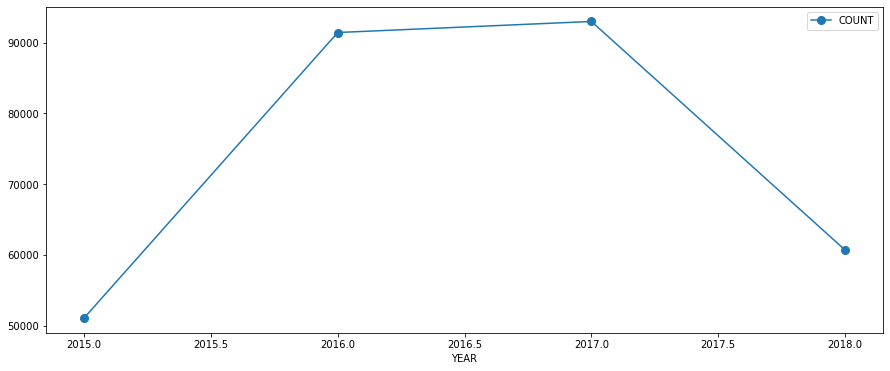

In [90]:
# Calculate the number of crimes in each year
# calculating the number of crimes in each year"
crimeyear = pd.DataFrame(df.groupby(['YEAR']).size().rename('COUNT').reset_index())
lineplot1 = crimeyear.plot.line(x="YEAR", y="COUNT", marker='o', markersize=8, figsize=(15, 6))



<b> The analysis result based on the visualization

* Terjadi peningkatan jumlah kejahatan yang signifikan dari tahun 2015 ke tahun 2016,
* Terlihat pola yang sama antara tahun 2016-2017 
* Namun, terdapat penurunan yang sangat signifikan pada jumlah kejahatan dari tahun 2017 hingga 2018.

# <b> Conclusion

Dari analisis yang telah dilakukan, kita bisa membuat kesimpulan berikut:

<b> Berdasarkan UCR_PART
* *UCR Part* adalah kategori yang digunakan oleh ***FBI*** untuk mengklasifikasikan jenis kejahatan, UCR Part dibagi menjadi 4 kategori yaitu *Part One*, *Part Two*, *Part Three*, dan *Other*.
* Dari *296222* data kejahatan, kasus terbanyak adalah ***Motor Vehicle Accident Response***.
* Untuk kasus terbanyak, berdasarkan *UCR Part One* adalah ***Larceny*** ,*Part Two* adalah ***Simple Assault***, *Part Three* adalah ***Motor Vehicle Accident Response***, dan *UCR Part Other* adalah ***Auto Theft Recovery***.
    
<b> Berdasarkan District dan Street
* ***Roxbury*** merupakan *district* yang memiliki tingkat kejahatan tertinggi di wilayah *Boston*.
* ***Washington St*** sebagai *street* yang memiliki tingkat kejahatan tertinggi. karena *Washington St* adalah jalan utama yang melintasi beberapa *district* di *Boston, Massachusetts.*
    
<b> Berdasarkan Tahun
* tahun ***2017*** menduduki posisi tertinggi tingkat kejahatan di wilayah *Boston*
* Terlihat adanya ***peningkatan signifikan*** dalam jumlah kejahatan dari tahun *2015* ke *2016*, namun terjadi ***penurunan yang signifikan*** dari tahun *2017* ke *2018*. Hal ini menunjukkan bahwa ketidaklengkapan data di tahun 2018.
* Ditemukan ***Part Other*** dan ***Part Three*** mengalami kenaikan setiap tahun *2015 - 2017* lalu turun di tahun *2018* <br>
* Terlihat juga bahwa sejak *2016 - 2017* ***Part One*** dan ***Part Two*** mengalami Penurunan, lalu turun di tahun *2018* <br> 
    
<b> Berdasarkan Bulan 
* bulan ***Juli*** dan ***Agustus*** menjadi bulan dengan tingkat kejahatan tertinggi di daerah *Boston*. membuktikan bahwa tingkat kejahatan dimusim panas cenderung lebih tinggi ketimbang musim lainnya.
    
 <b> Berdasarkan Hari, Tanggal dan Waktu  
* Meskipun tidak ada perbedaan yang signifikan dalam jumlah kejahatan berdasarkan hari dalam seminggu, insiden terbanyak cenderung terjadi pada hari ***Jumat***.
* Puncak kejadian kejahatan terjadi pada rentang waktu ***16.00-19.00***.
* Terdapat kejadian kejahatan yang signifikan di tanggal ***01-09-2016*** dan ***01-09-2017*** dengan jumlah insiden yang terbanyak. Hal ini kemungkinan dipengaruhi oleh adanya *concert music* yang diadakan pada tanggal tersebut setiap tahunnya.

<b> Berdasarkan terjadinya Penembakan
* Tahun *2017* merupakan tahun dengan banyak kejadian ***penembakan*** di*Boston*."
* ***Roxbury*** adalah * district* dengan jumlah kasus penembakan terbanyak.
* Jenis kejahatan yang paling sering terjadi dalam kasus penembakan adalah ***Aggravated Assault.***


# <b> Recomendation

ada beberapa *recomendation* yang bisa dipertimbangkan antara lain:

1. Meningkatkan patroli di daerah ***Roxbury dan Washington St***, karena wilayah ini memiliki tingkat kejahatan tertinggi di *Boston*.
2. Meningkatkan keamanan dan memperketat pengawasan di tempat-tempat yang menjadi target kejahatan, seperti ***tempat parkir, tempat hiburan, dan tempat umum lainnya.***
3. ***memasang CCTV*** dan pencahayaan yang cukup untuk mencegah terjadinya kejahatan.
4. Meningkatkan patroli secara merata untuk ***setiap hari*** dan memberikan pengawasan lebih, terutama pada rentang waktu ***16.00-19.00.***
5. Memberikan pengawasan khusus pada musim panas di kawasan publik yang ramai dikunjungi, khususnya di bulan ***Juli*** dan ***Agustus.***
6. Melakukan pemeriksaan kendaraan secara rutin untuk mengurangi jumlah insiden ***Motor Vehicle Accident Response.***
7. Memberikan ***sosialisasi*** kepada masyarakat tentang kejahatan untuk mencegah terjadinya kejahatan.
8. Meningkatkan jumlah ***polisi*** dan memberikan pelatihan yang lebih baik kepada mereka untuk meningkatkan efektivitas dalam mencegah kejahatan.

Dengan menerapkan ***rekomendasi-rekomendasi*** tersebut, Pemerintah bisa membuat strategi khusus agar bisa mengurangi tingkat [kejahatan](https://www.kompasiana.com/kelompok1spkkh/60dc1c6a06310e562c664db2/strategi-pencegahan-kejahatan-dengan-upaya-pendekatan-sosial) dengan tujuan ***mengurangi tingkat kejahatan*** di wilayah *Boston* dan ***memberikan rasa aman bagi masyarakat setempat***. 